# Monte Carlo Analysis Stock Market Investment
**Authors:**<br>
Sonwabile Diko (217050276)<br>
Motau Simphiwe (219055400)<br>
Luvo Spofana (216086289)<br>
<br>
**Source:** [API Key](https://www.alphavantage.co/)<br>
**GitHub:** [Jupyter-Notebook GitHub](https://github.com/)<br>
**Date:** 18 October 2023<br>

## Introduction
Investing in the stock market can be rewarding but risky, particularly for young investors with long-term plans to maximize their earnings. This assignment will use Monte Carlo analysis to simulate various stock returns using random variables and historical data from different asset classes. The Yahoo Finance API will be used to retrieve the historical performance of five asset classes: Vanguard ETFs, Crypto, Gold, Fidelity International Index Fund, and Satrix Top 40. It will be assumed that an investor has inherited R100,000 and plans to invest the money for 40 years and receive it for retirement at the age of 60. Therefore, the expected returns and risks for different asset class indexes will be compared to determine the best stock to invest in based on the return on investment.

## 1.  Import and Variables

### 1.1 Import Libraries

In [1]:
import locale
import random
import numpy as np
import pandas as pd
import alpha_vantage
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
warnings.filterwarnings("ignore")
import yfinance as yfin
yfin.pdr_override()

from math import sqrt
from pandas_datareader import data as wb

sns.set_style("whitegrid")

### 1.2 Declare Global Variables

In [2]:
data = ""
current_price = 0
mean_stock_price = 0
median_stock_price = 0
lower_bound = 0
upper_bound = 0
final_stock_price = 0
FV_ZAR = 0
capital_gain = 0
capital_gain_percentage = 0
largest_price_symbol = ""
largest_price_value = 0
largest_capital_gp = 0

## 2. Functions

### 2.1 Stock Analysis Function (Data Visualization and Regression)
This function is used to display the linear regression and historical performance of different stock prices. The Yahoo Finance API was selected to get the stock's historical performance since it’s free, easy-to-use, and reliable for getting historical data. The linear regression was used to identify and predict the trend of stock prices.

In [3]:
def plot_stock_analysis(symbol, graph_color, regression):
    # Insert stock index data using yfinance
    global data
    data = wb.get_data_yahoo(symbol)

    # Convert the date index to numerical values
    x = mdates.date2num(data.index.to_pydatetime())

    # Extract the closing prices of the stock
    y = data['Adj Close']

    # Calculate the slope and intercept for the linear regression line
    slope, intercept = np.polyfit(x, y, 1)

    # Create a figure and a graph for plotting
    fig, graph = plt.subplots(figsize=(10, 5))

    # Plot the actual stock price
    graph.plot(data.index, data['Adj Close'], color=graph_color)

    # Plot the linear regression line
    graph.plot(data.index, slope * x + intercept, color='#e60000')

    # Add a legend to the graph
    graph.legend([f'{symbol} Price', 'Predicted Price'])
    
    print("\nThe regression analysis shows that the " + symbol + " stock will go " + regression + ".")

    # Set the title and labels for the graph
    plt.title(f'{symbol} Stock Market Analysis')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')

    # Display the graph
    plt.show()

### 2.2 Monte Carlo Simulation Fuction
This function uses Monte Carlo analysis to simulate various stock returns and volatility based on random variables and historical data from different stocks.

#### Monte Carlo analysis steps:
#### 1. Define the decision values
* Adjusted close price: The current (today’s) adjusted close price was used since it’s a realistic starting point and makes the analysis more relevant to the current market conditions.
* Years: 40 years was chosen since we assumed the investor will receive the money when he is 60 years old.
* Trading days: 252 was chosen since this is the number of trading days in a year.
#### 2. Model the state of uncertainty
* Stock return and volatility were used as random variables to predict simulated annual stock returns because they can create a model that reflects the real-world characteristics of stock market fluctuations.
* Simulations: A large number of simulations (1000) were used since they improve the accuracy of the Monte Carlo results. According to Giles Mike, more simulations allow for a finer approximation of the probability distribution or expected values you are estimating.
#### 3. Compute the value of additional information
* The mean stock price was used to calculate and predict the expected stock price.
#### 4. Measure where information is high
* The 90% confidence interval was used in this assignment since it’s the common interval used in the Monte Carlo analysis with precision of 90% and 10% risk.
* The median stock price was used to calculate the middle, or most likely, stock price in terms of the 90% confidence interval.


In [4]:
def monte_carlo_simulation(symbol, currency):
    # Define the decision

    # Current stock price
    global current_price
    current_price = data['Adj Close'].iloc[-1]

    # Define the number of years for the simulation
    years = 40 # Assuming you will receive the money when you are 60 years old

    # Number of trading days in a year
    trading_days = 252

    # Model the state of uncertainty

    # Calculate the stock annual return
    stock_return = data['Adj Close'].pct_change().mean() * np.sqrt(252)

    # Calculate the stock volatility
    stock_volatility = data['Adj Close'].pct_change().std()

    # Number of simulations
    simulations = 1000

    # Create an empty DataFrame to store simulation results
    results = pd.DataFrame()

    # Run the Monte Carlo simulation
    for i in range(simulations):

        # Create a list to store the yearly stock prices
        yearly_prices = []

        # Set initial stock price
        stock_price = current_price

        # Append the stock price to the list
        yearly_prices.append(stock_price)

        # Loop through each year
        for j in range(years):

            # Simulate the annual stock return
            stock_return_sim = np.random.normal(stock_return, stock_volatility)

            # Update the stock price for the current year based on the annual stock return
            stock_price *= (1 + stock_return_sim)

            # Append the updated stock price to the list
            yearly_prices.append(stock_price)

        # Create a new column in the results DataFrame for each simulation
        results[i] = pd.Series(yearly_prices)

    # Compute the value of additional information

    # Extract the stock prices from the last year of each simulation
    global final_stock_price
    final_stock_price = results.iloc[-1]

    # Calculate the mean of stock price
    global mean_stock_price
    mean_stock_price = final_stock_price.mean()
    
    # Calculate the median of stock price
    global median_stock_price
    median_stock_price = final_stock_price.median()
    
    # Measure where information is high
    # Calculate the lower and upper bounds of the 90% confidence interval of stock price
    global lower_bound
    lower_bound = np.percentile(final_stock_price, 5)
    global upper_bound
    upper_bound = np.percentile(final_stock_price, 95)
    
    # Format the money using the United States locale (en_US)
    locale.setlocale(locale.LC_ALL, currency)

    print(symbol + " expected stock price is: " + locale.currency(mean_stock_price, grouping=True))

    # Create a plot for the Monte Carlo simulation results
    plt.figure(figsize=(12,5))
    plt.plot(results)
    plt.title("Monte Carlo Simulation of " + symbol)
    plt.xlabel("Years")
    plt.ylabel("Balance")
    plt.show()

### 2.3 Stock Price Distribution Analysis Fuction
This function uses the stock price distribution to show the 90% confidence interval and median of the stock price.

In [5]:
def stock_price_distribution(symbol, currency):
    
    # Format the money using the United States locale (en_US)
    locale.setlocale(locale.LC_ALL, currency)
    
    # Measure where information is high
    print(symbol + " median stock price: "+ locale.currency(median_stock_price, grouping=True))

    # We will use the 90% confidence interval of the final balances as a measure of where information is high
    print(symbol + " stock price 90% confidence interval: (" + locale.currency(lower_bound, grouping=True) + " : " + locale.currency(upper_bound, grouping=True) + ")")

    # Plot distribution of stock price
    plt.figure(figsize=(10, 5))
    sns.distplot(final_stock_price, color='gray')
    plt.axvline(lower_bound, color='red', linestyle='dashed', linewidth=2)
    plt.axvline(upper_bound, color='blue', linestyle='dashed', linewidth=2)
    plt.axvline(median_stock_price, color='green', linestyle='dashed', linewidth=2)
    plt.title(symbol + ' Stock Price Distribution')
    plt.xlabel('Final Amount')
    plt.ylabel('Frequency')
    plt.show()

### 2.4 Return On Investment Fuction
This function is used to calculate the return on investment based on the Monte Carlo analysis expected stock price.

In [6]:
def calculate_return_on_investment(symbol, exchange_rate, currency):
    # Initial investment amount in South African Rands
    PV_ZAR = 100000

    # Number of years
    years = 40 # Assuming you will receive the money when you are 60 years old

    # Current stock price
    initial_stock_price = current_price

    # Final stock price in 2063
    final_stock_price = mean_stock_price

    # calculate stock growth rate
    growth_rate = (final_stock_price / initial_stock_price) / 100

    # Calculate the value of your investment in US Dollars
    PV_USD = PV_ZAR / exchange_rate
    
    # Calculate the number of stocks bought
    stocks_bought = PV_USD / initial_stock_price

    # Calculate the final amount after selling the stocks in 2053
    FV_USD = stocks_bought * final_stock_price
    
    # Convert the return on investment back to South African Rand
    global FV_ZAR
    FV_ZAR = FV_USD * exchange_rate

    # Format the money using the South African locale (en_ZA)
    locale.setlocale(locale.LC_ALL, currency)

    print("Initial investment: " + locale.currency(PV_ZAR, grouping=True))
    print(symbol + " Return on investment: " + locale.currency(FV_ZAR, grouping=True))

    # Calculate capital gain and percentage
    global capital_gain
    capital_gain = FV_ZAR - PV_ZAR

    # Calculate capital gain percentage
    global capital_gain_percentage
    capital_gain_percentage = (capital_gain / PV_ZAR) * 100

    print(symbol + " Capital gain/loss: " + locale.currency(capital_gain, grouping=True))
    print(symbol + " Capital gain/loss percentage: " + str(round(capital_gain_percentage, 2)) + "%")

### 2.5 Compare Stocks
This function is used to compare and identify the best-performing stock.

In [7]:
def compare_stocks(stock_name, indexes, currency):

    # Set the seaborn style to "white"
    sns.set_style("white")

    # Create a DataFrame from the 'indexes' data
    df_indexes = pd.DataFrame(indexes)

    # Create a figure with a specific size
    plt.figure(figsize=(8, 4))

    # Define a list of colors and shuffle them randomly
    colors = ['#3bb0de', '#cc0000', '#ff6600', '#996633', '#808080', '#b84dff', '#009933', '#2d5986', '#ff8095']
    random.shuffle(colors)

    # Create a horizontal bar chart with specified data and colors
    plt.barh(df_indexes.indexes, df_indexes.prices, height=0.3, color=colors)

    # Add labels with currency formatting to the bars
    for index, value in enumerate(df_indexes.prices):
        output = " " + locale.currency(value, grouping=True)
        plt.text(value, index, output, va='center', fontsize=10, color='#000000')

    # Customize the color of the graph border
    ax = plt.gca()  
    ax.spines['top'].set_color('#a6a6a6') 
    ax.spines['right'].set_color('#a6a6a6')
    ax.spines['bottom'].set_color('#a6a6a6')
    ax.spines['left'].set_color('#a6a6a6')

    # Find the index of the largest price
    largest_price_index = indexes['prices'].index(max(indexes['prices']))

    # Get the corresponding index, price, and capital gain percentage
    global largest_price_symbol
    largest_price_symbol = indexes['indexes'][largest_price_index]
    global largest_price_value
    largest_price_value = indexes['prices'][largest_price_index]
    global largest_capital_gp
    largest_capital_gp = indexes['capital_gains_percentage'][largest_price_index]

    print(largest_price_symbol + " is the index with the largest return on investment: " + locale.currency(largest_price_value, grouping=True) + " and capital gain percentage of " + str(round(largest_capital_gp, 2)) + "%")

    # Set the seaborn style back to "whitegrid"
    sns.set_style("whitegrid")
    
    plt.title(stock_name + " Indexes")
    plt.xlabel('Return On Investments')
    plt.show()

## 3. Investment Options
This section will be used to analyze and compare indexes from the same asset class and identify the best-performing index for each asset class.

## 3.1 Vanguard ETFs

### 3.1.1 Vanguard Total Stock Market Index (VTI)

### VTI Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VTI stock will go up.


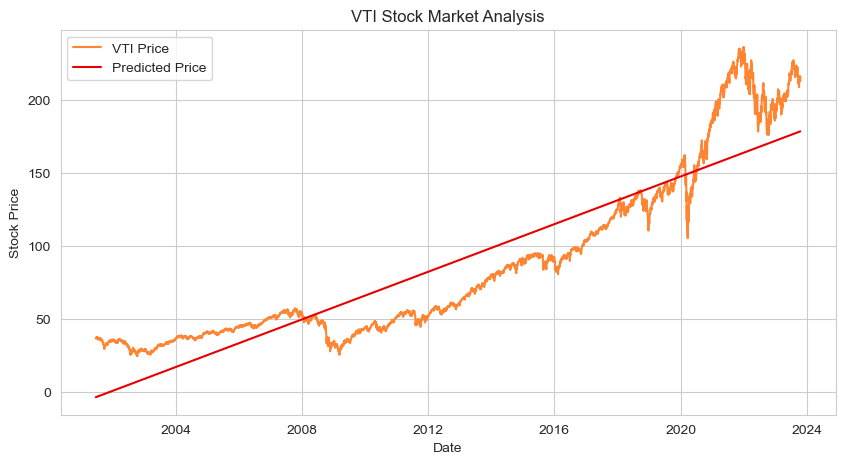

In [8]:
plot_stock_analysis('VTI', '#ff8533', 'up')

### VTI Monte Carlo Analysis

VTI expected stock price is: $271.47


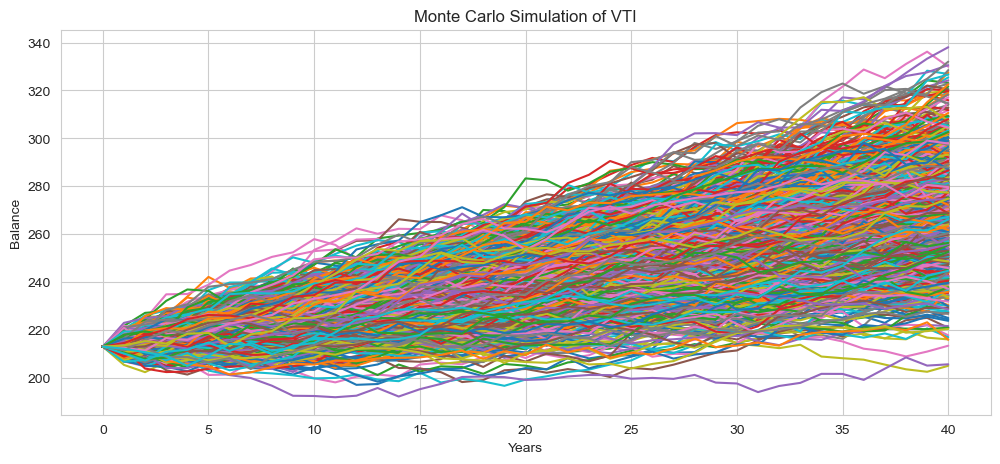

In [9]:
monte_carlo_simulation('VTI', 'en_US.UTF-8')

### VTI Monte Carlo Simulation Shape Distribution

VTI median stock price: $271.28
VTI stock price 90% confidence interval: ($236.88 : $305.72)


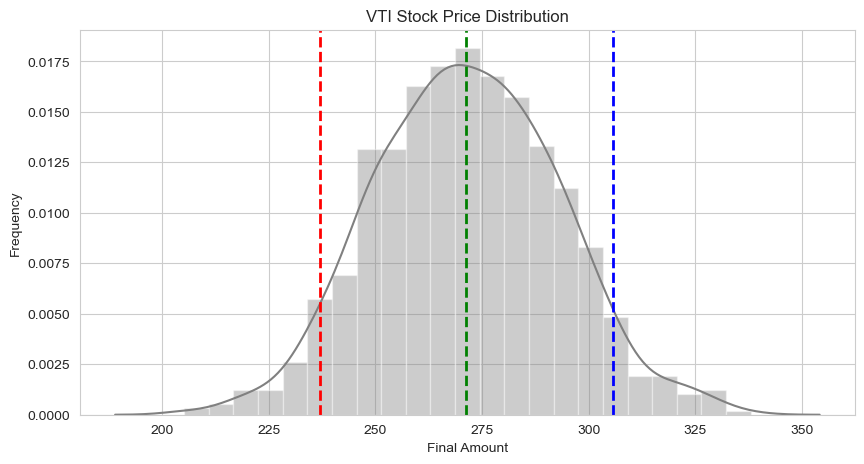

In [10]:
stock_price_distribution('VTI', 'en_US.UTF-8')

### Calculate VTI Return On Investment

In [11]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VTI', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VTI_FV_ZAR = FV_ZAR
VTI_capital_gain = capital_gain
VTI_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VTI Return on investment: R127 398,66
VTI Capital gain/loss: R27 398,66
VTI Capital gain/loss percentage: 27.4%


### 3.1.2 Vanguard S&P 500 ETF (VOO)

### VOO Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VOO stock will go up.


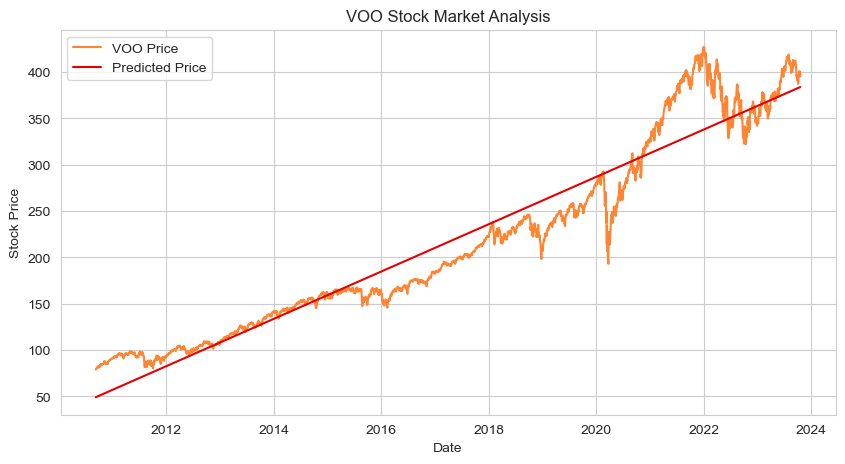

In [12]:
plot_stock_analysis('VOO', '#ff8533', 'up')

### VOO Monte Carlo Analysis

VOO expected stock price is: $559.40


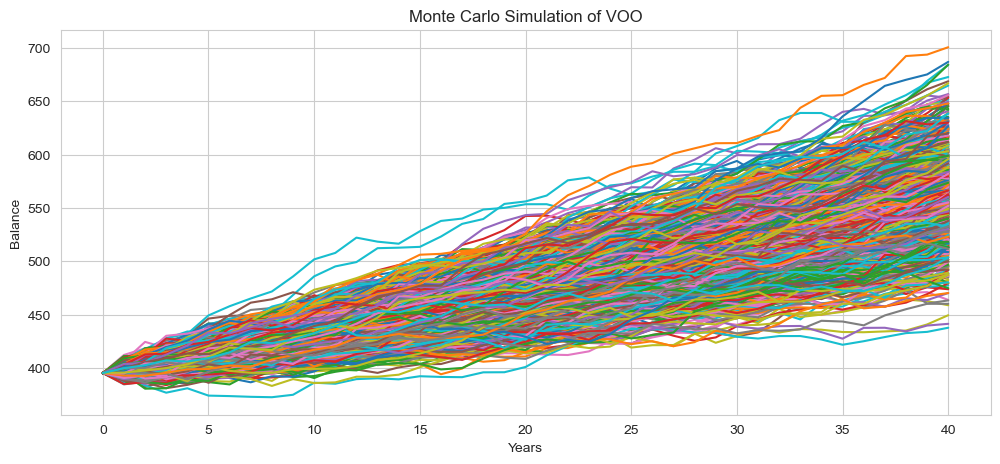

In [13]:
monte_carlo_simulation('VOO', 'en_US.UTF-8')

### VOO Monte Carlo Simulation Shape Distribution

VOO median stock price: $557.25
VOO stock price 90% confidence interval: ($499.24 : $625.78)


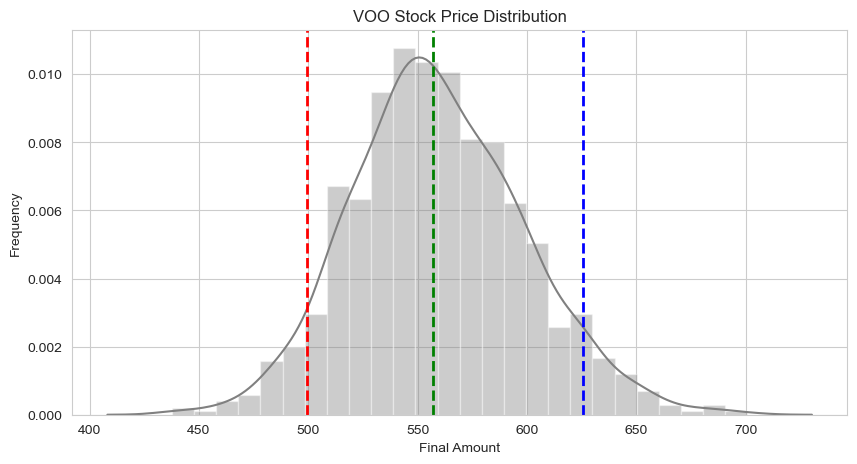

In [14]:
stock_price_distribution('VOO', 'en_US.UTF-8')

### Calculate VOO Return On Investment

In [15]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VOO', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VOO_FV_ZAR = FV_ZAR
VOO_capital_gain = capital_gain
VOO_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VOO Return on investment: R141 542,17
VOO Capital gain/loss: R41 542,17
VOO Capital gain/loss percentage: 41.54%


### 3.1.3 Vanguard FTSE Emerging Market ETF (VWO)

### VWO Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VWO stock will go up.


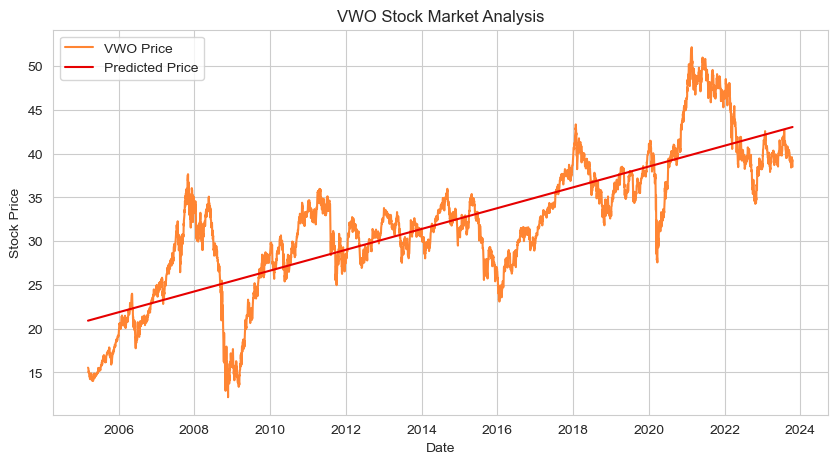

In [16]:
plot_stock_analysis('VWO', '#ff8533', 'up')

### VWO Monte Carlo Analysis

VWO expected stock price is: $47.61


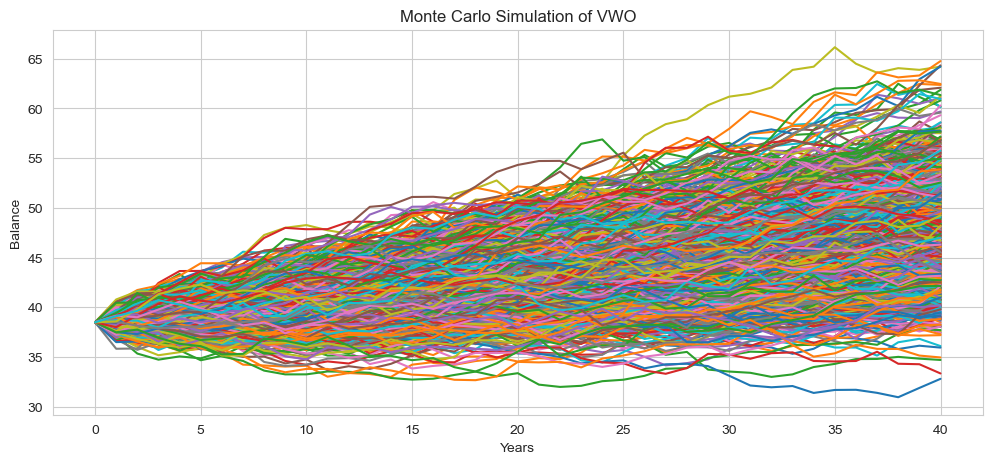

In [17]:
monte_carlo_simulation('VWO', 'en_US.UTF-8')

### VWO Monte Carlo Simulation Shape Distribution

VWO median stock price: $47.25
VWO stock price 90% confidence interval: ($39.82 : $56.49)


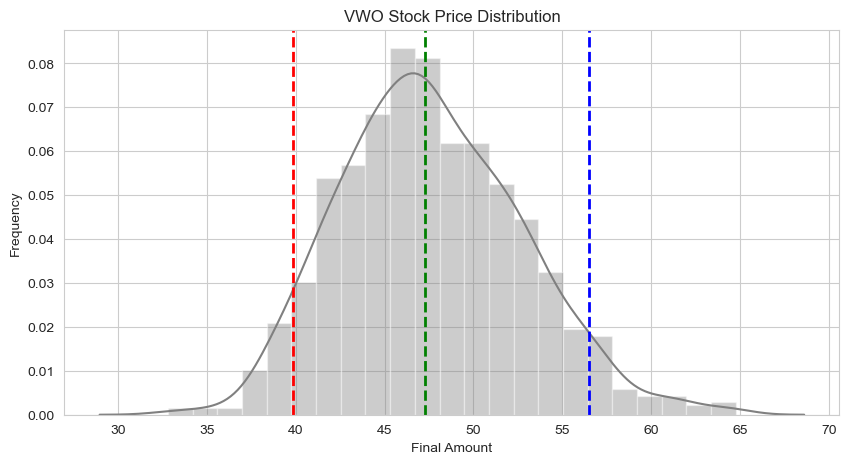

In [18]:
stock_price_distribution('VWO', 'en_US.UTF-8')

### Calculate VWO Return On Investment

In [19]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VWO', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VWO_FV_ZAR = FV_ZAR
VWO_capital_gain = capital_gain
VWO_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VWO Return on investment: R123 670,91
VWO Capital gain/loss: R23 670,91
VWO Capital gain/loss percentage: 23.67%


### 3.1.4 Vanguard FTSE Developed Markets ETF (VEA)

### VEA Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VEA stock will go up.


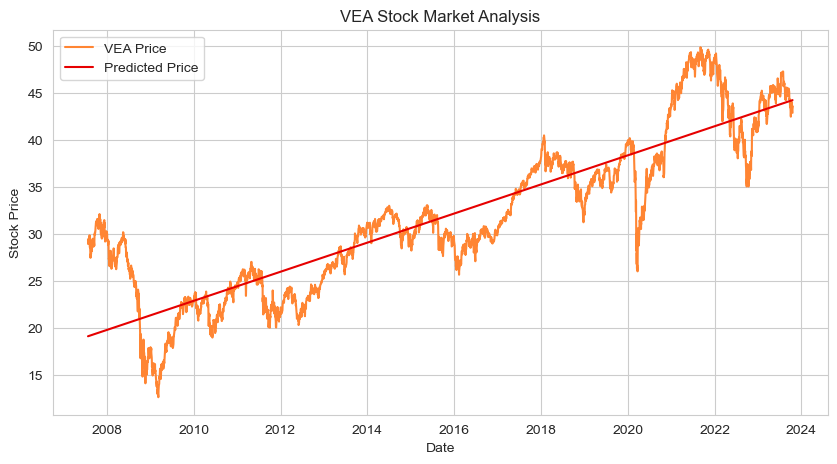

In [20]:
plot_stock_analysis('VEA', '#ff8533', 'up')

### VEA Monte Carlo Analysis

VEA expected stock price is: $48.58


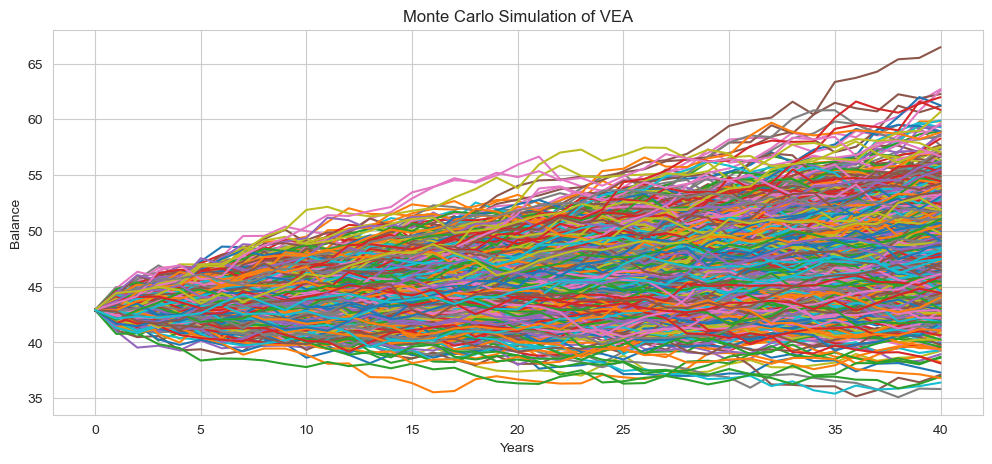

In [21]:
monte_carlo_simulation('VEA', 'en_US.UTF-8')

### VEA Monte Carlo Simulation Shape Distribution

VEA median stock price: $48.38
VEA stock price 90% confidence interval: ($41.82 : $56.04)


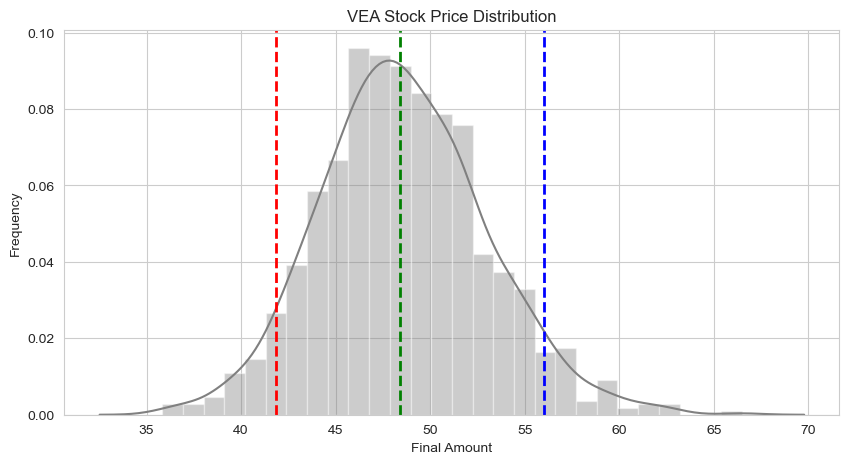

In [22]:
stock_price_distribution('VEA', 'en_US.UTF-8')

### Calculate VEA Return On Investment

In [23]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VEA', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VEA_FV_ZAR = FV_ZAR
VEA_capital_gain = capital_gain
VEA_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VEA Return on investment: R113 217,03
VEA Capital gain/loss: R13 217,03
VEA Capital gain/loss percentage: 13.22%


### 3.1.5 Vanguard Total Internationl Stock ETF (VXUS)

### VXUS Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VXUS stock will go up.


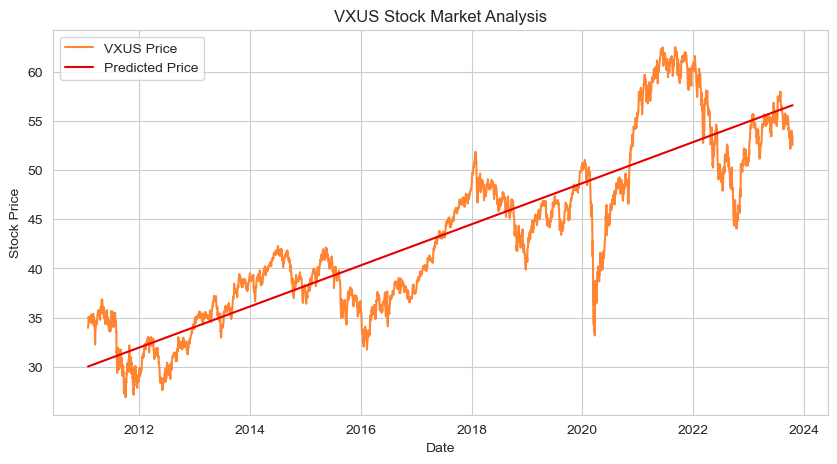

In [24]:
plot_stock_analysis('VXUS', '#ff8533', 'up')

### VXUS Monte Carlo Analysis

VXUS expected stock price is: $59.76


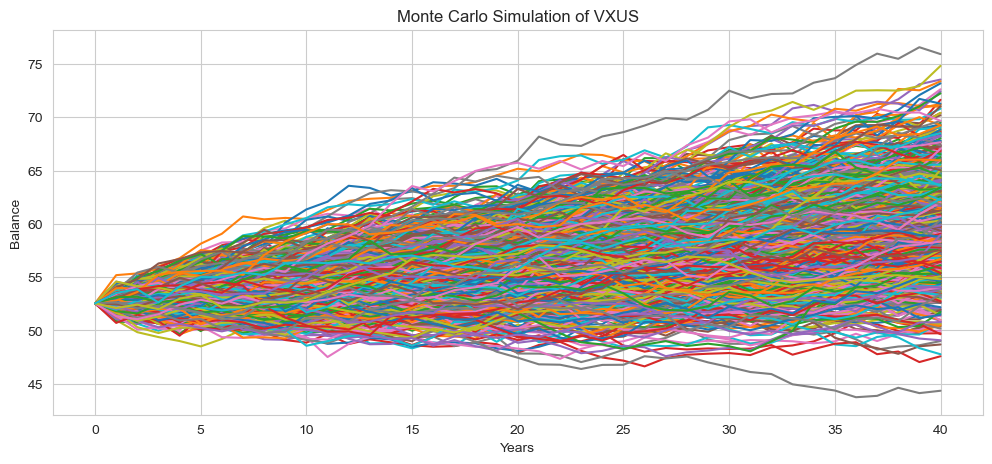

In [25]:
monte_carlo_simulation('VXUS', 'en_US.UTF-8')

### VXUS Monte Carlo Simulation Shape Distribution

VXUS median stock price: $59.60
VXUS stock price 90% confidence interval: ($53.17 : $67.36)


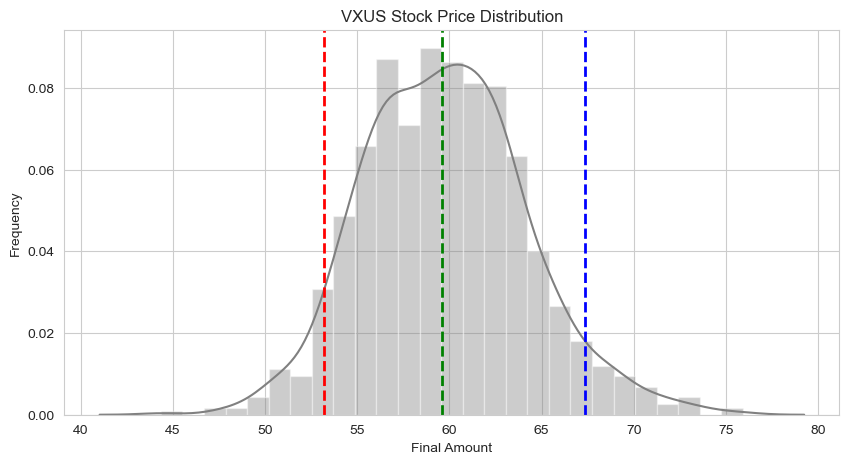

In [26]:
stock_price_distribution('VXUS', 'en_US.UTF-8')

### Calculate VXUS Return On Investment

In [27]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VXUS', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VXUS_FV_ZAR = FV_ZAR
VXUS_capital_gain = capital_gain
VXUS_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VXUS Return on investment: R113 750,63
VXUS Capital gain/loss: R13 750,63
VXUS Capital gain/loss percentage: 13.75%


### 3.1.6 Vanguard Total Bond Market ETF (BND)

### BND Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the BND stock will go up.


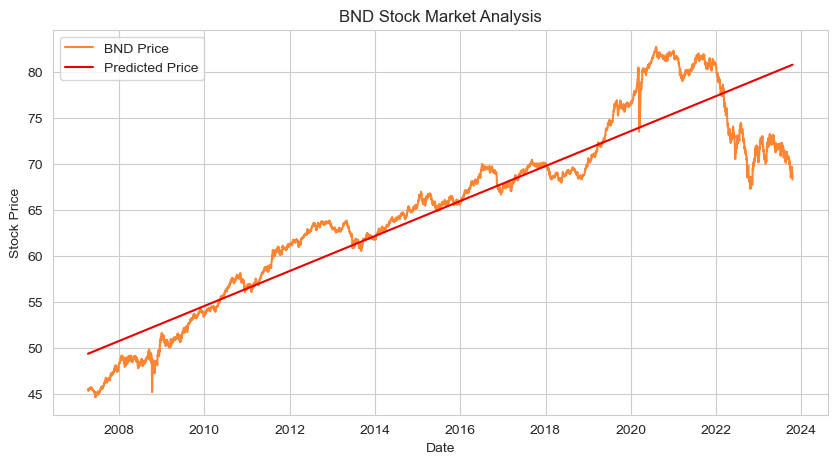

In [28]:
plot_stock_analysis('BND', '#ff8533', 'up')

### BND Monte Carlo Analysis

BND expected stock price is: $72.93


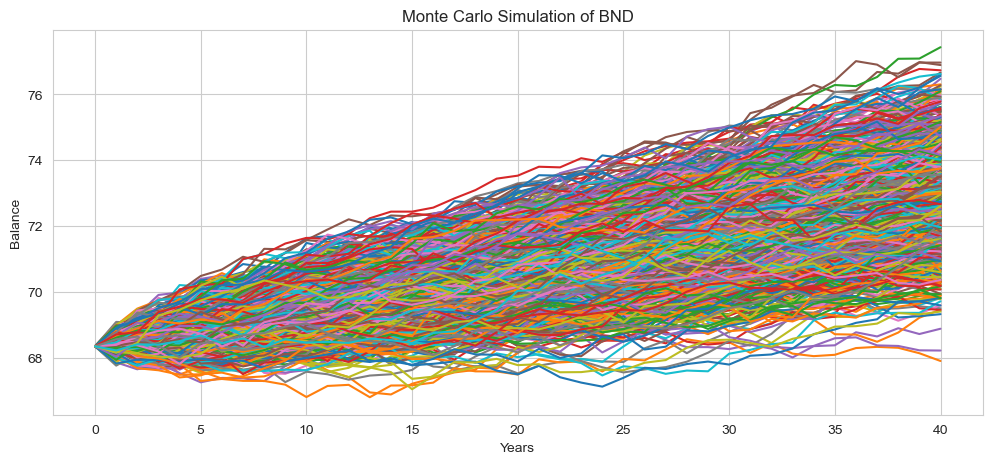

In [29]:
monte_carlo_simulation('BND', 'en_US.UTF-8')

### BND Monte Carlo Simulation Shape Distribution

BND median stock price: $72.93
BND stock price 90% confidence interval: ($70.50 : $75.34)


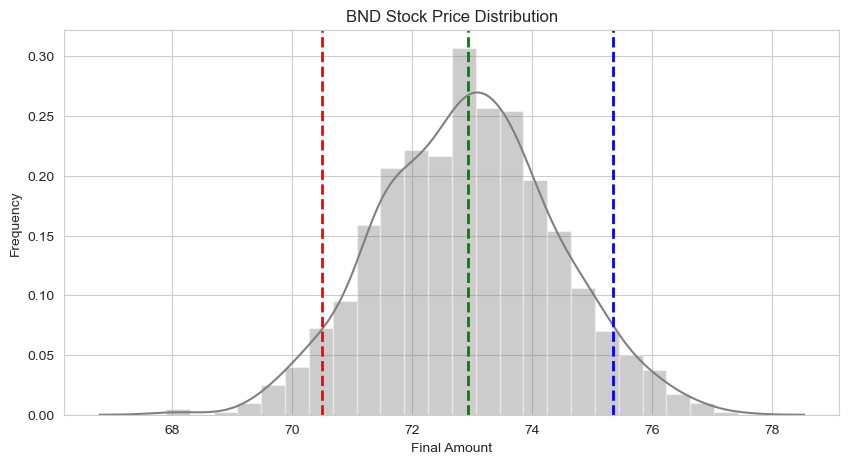

In [30]:
stock_price_distribution('BND', 'en_US.UTF-8')

### Calculate BND Return On Investment

In [31]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('BND', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
BND_FV_ZAR = FV_ZAR
BND_capital_gain = capital_gain
BND_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
BND Return on investment: R106 718,90
BND Capital gain/loss: R6 718,90
BND Capital gain/loss percentage: 6.72%


### 3.1.7 Vanguard Real Estate ETF (VNQ)

### VNQ Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the VNQ stock will go up.


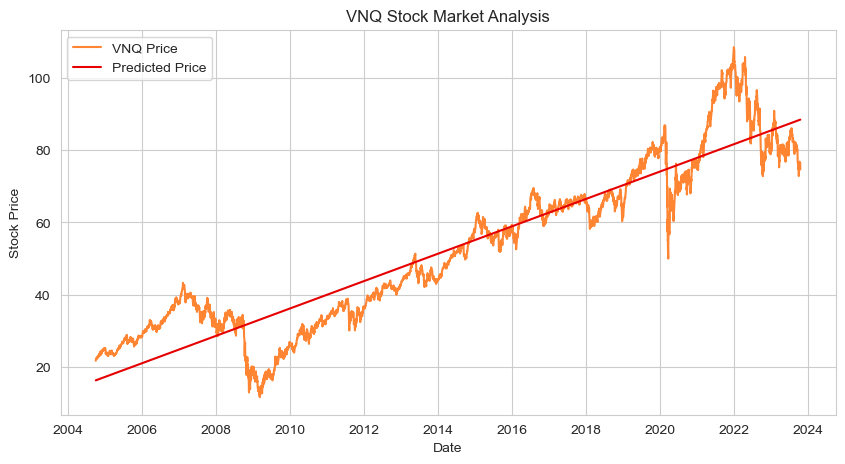

In [32]:
plot_stock_analysis('VNQ', '#ff8533', 'up')

### VNQ Monte Carlo Analysis

VNQ expected stock price is: $98.46


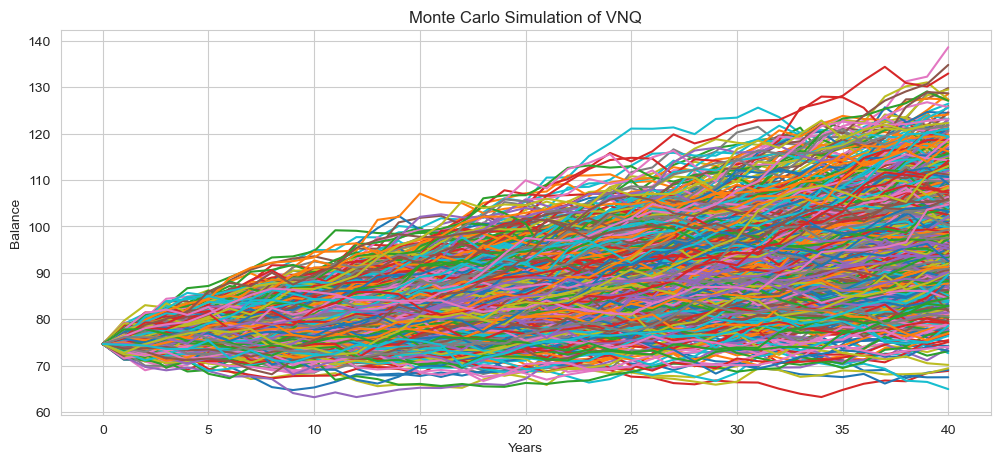

In [33]:
monte_carlo_simulation('VNQ', 'en_US.UTF-8')

### VNQ Monte Carlo Simulation Shape Distribution

VNQ median stock price: $98.12
VNQ stock price 90% confidence interval: ($80.00 : $119.30)


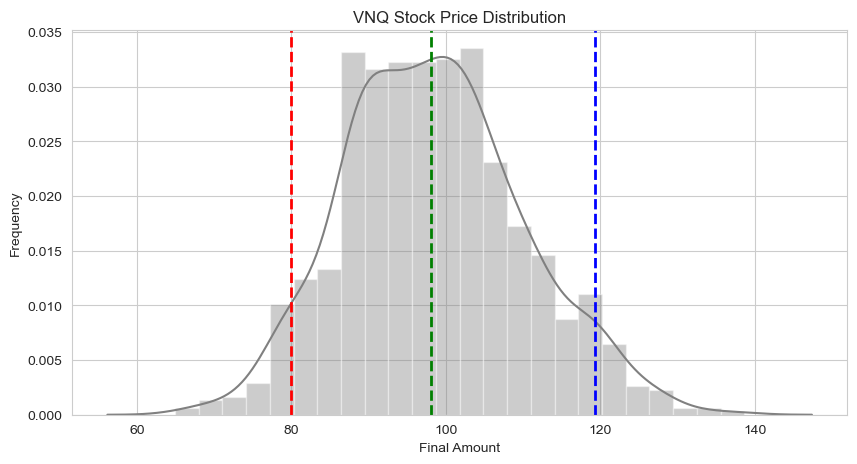

In [34]:
stock_price_distribution('VNQ', 'en_US.UTF-8')

### Calculate VNQ Return On Investment

In [35]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('VNQ', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
VNQ_FV_ZAR = FV_ZAR
VNQ_capital_gain = capital_gain
VNQ_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
VNQ Return on investment: R131 877,99
VNQ Capital gain/loss: R31 877,99
VNQ Capital gain/loss percentage: 31.88%


### Compare Vanguard Indexes

Vanguard S&P 500 is the index with the largest return on investment: R141 542,17 and capital gain percentage of 41.54%


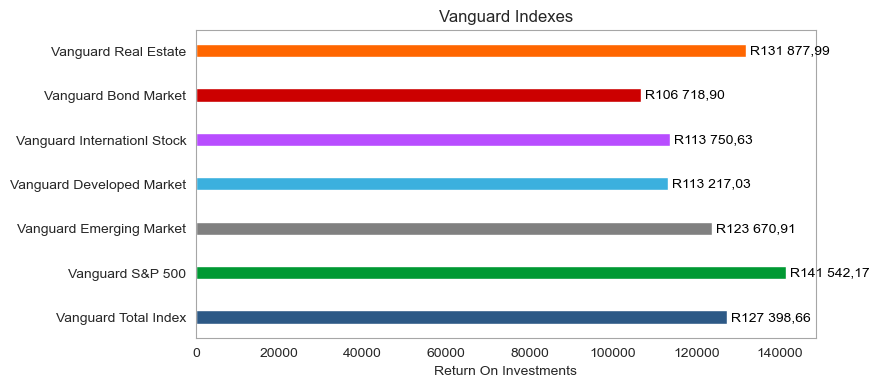

In [36]:
# Define financial market indexes
indexes = {
    'indexes': ['Vanguard Total Index', 'Vanguard S&P 500', 'Vanguard Emerging Market', 'Vanguard Developed Market', 'Vanguard Internationl Stock', 'Vanguard Bond Market', 'Vanguard Real Estate'],
    'prices': [VTI_FV_ZAR, VOO_FV_ZAR, VWO_FV_ZAR, VEA_FV_ZAR, VXUS_FV_ZAR, BND_FV_ZAR, VNQ_FV_ZAR],
    'capital_gains': [VTI_capital_gain, VOO_capital_gain, VWO_capital_gain, VEA_capital_gain, VXUS_capital_gain, BND_capital_gain, VNQ_capital_gain],
    'capital_gains_percentage': [VTI_capital_gain_percentage, VOO_capital_gain_percentage, VWO_capital_gain_percentage, VEA_capital_gain_percentage, VXUS_capital_gain_percentage, BND_capital_gain_percentage, VNQ_capital_gain_percentage]
}

compare_stocks('Vanguard', indexes, 'en_ZA.UTF-8')

# Store best stock for comparism with other stocks
vanguard_largest_price_symbol = largest_price_symbol
vanguard_largest_price_value = largest_price_value
vanguard_largest_capital_gp = largest_capital_gp

## 3.2 Crypto

### 3.2.1 Bitcoin (BTC)

### BTC Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the BTC stock will go down.


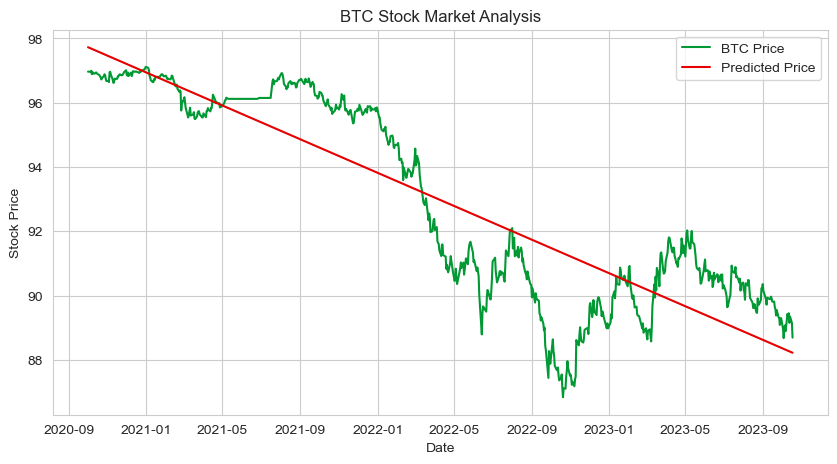

In [37]:
plot_stock_analysis('BTC', '#009933', 'down')

### BTC Monte Carlo Analysis

BTC expected stock price is: $82.47


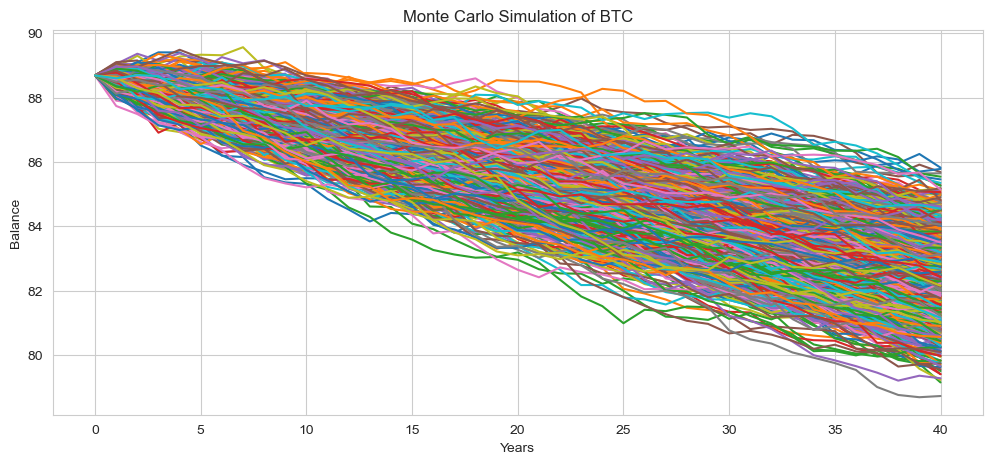

In [38]:
monte_carlo_simulation('BTC', 'en_US.UTF-8')

### BTC Monte Carlo Simulation Shape Distribution

BTC median stock price: $82.44
BTC stock price 90% confidence interval: ($80.43 : $84.51)


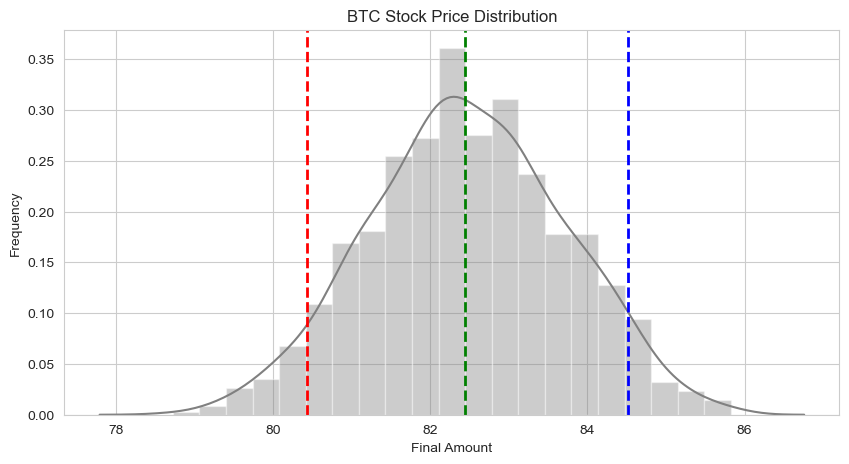

In [39]:
stock_price_distribution('BTC', 'en_US.UTF-8')

### Calculate BTC Return On Investment

In [40]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('BTC', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
BTC_FV_ZAR = FV_ZAR
BTC_capital_gain = capital_gain
BTC_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
BTC Return on investment: R92 988,26
BTC Capital gain/loss: R-7 011,74
BTC Capital gain/loss percentage: -7.01%


### 3.2.2 ChainLink (LINK)

### LINK Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the LINK stock will go slightly down.


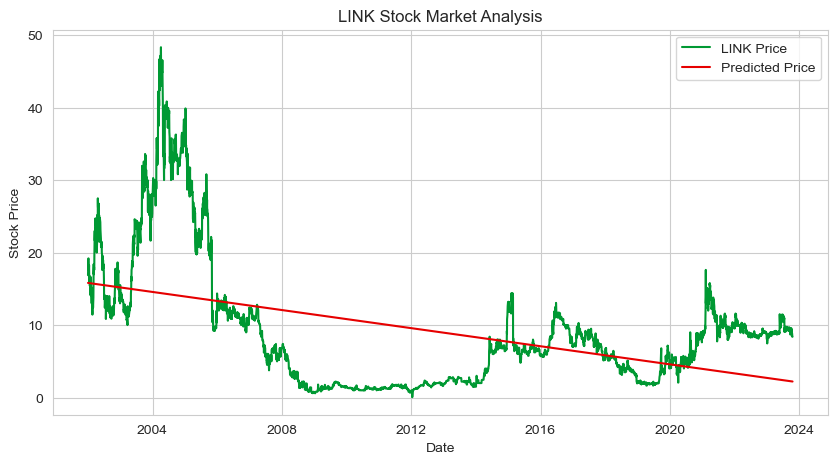

In [41]:
plot_stock_analysis('LINK', '#009933', 'slightly down')

### LINK Monte Carlo Analysis

LINK expected stock price is: $168.19


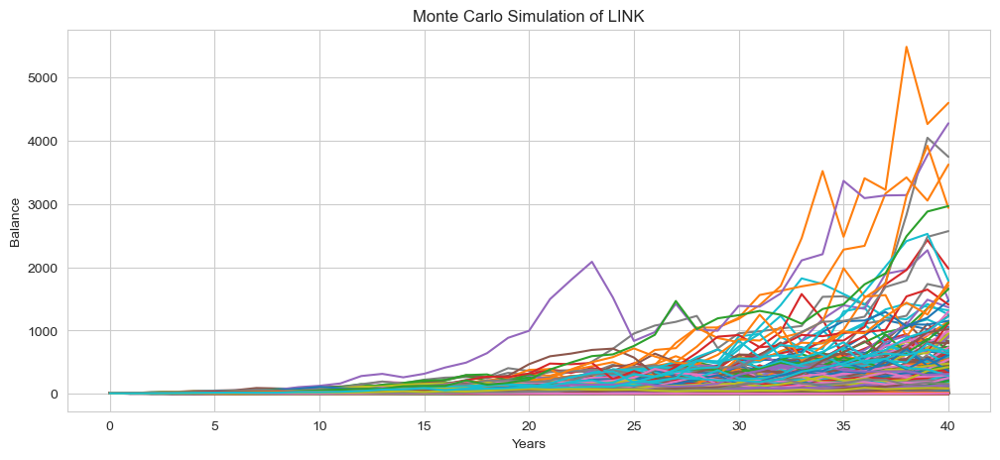

In [42]:
monte_carlo_simulation('LINK', 'en_US.UTF-8')

### LINK Monte Carlo Simulation Shape Distribution

LINK median stock price: $52.58
LINK stock price 90% confidence interval: ($2.36 : $667.22)


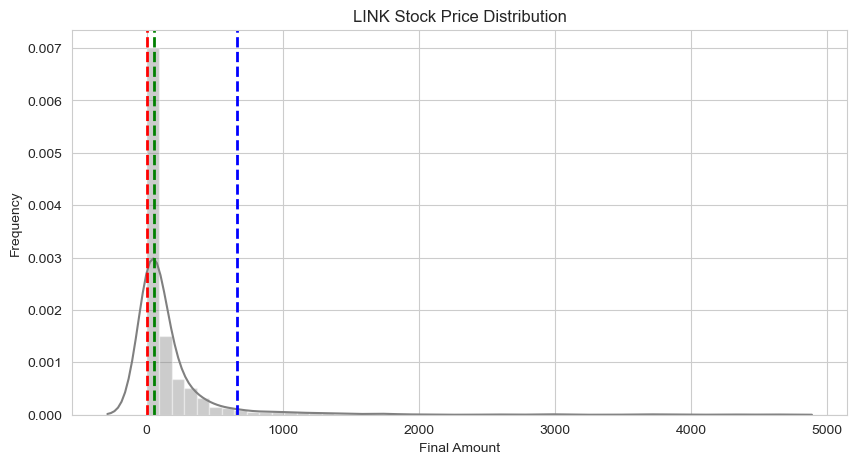

In [43]:
stock_price_distribution('LINK', 'en_US.UTF-8')

### Calculate LINK Return On Investment

In [44]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('LINK', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
LINK_FV_ZAR = FV_ZAR
LINK_capital_gain = capital_gain
LINK_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
LINK Return on investment: R2 002 233,77
LINK Capital gain/loss: R1 902 233,77
LINK Capital gain/loss percentage: 1902.23%


### 3.2.3 Bitcoin Cash (BCH)

### BCH Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the BCH stock will go up.


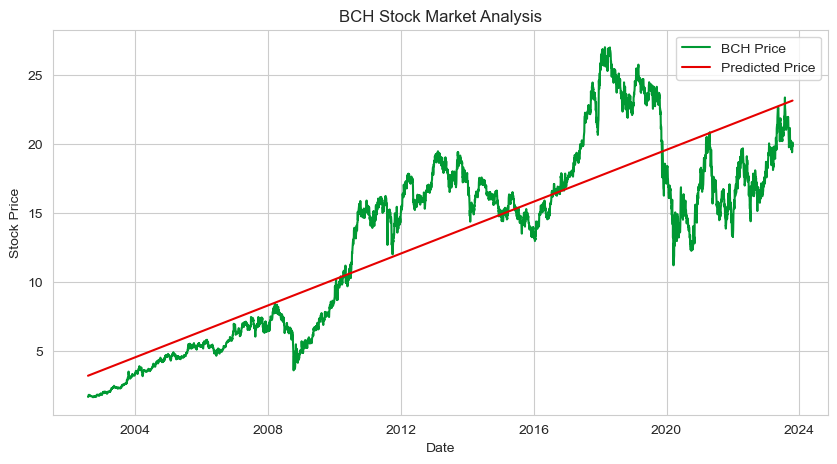

In [45]:
plot_stock_analysis('BCH', '#009933', 'up')

### BCH Monte Carlo Analysis

BCH expected stock price is: $30.10


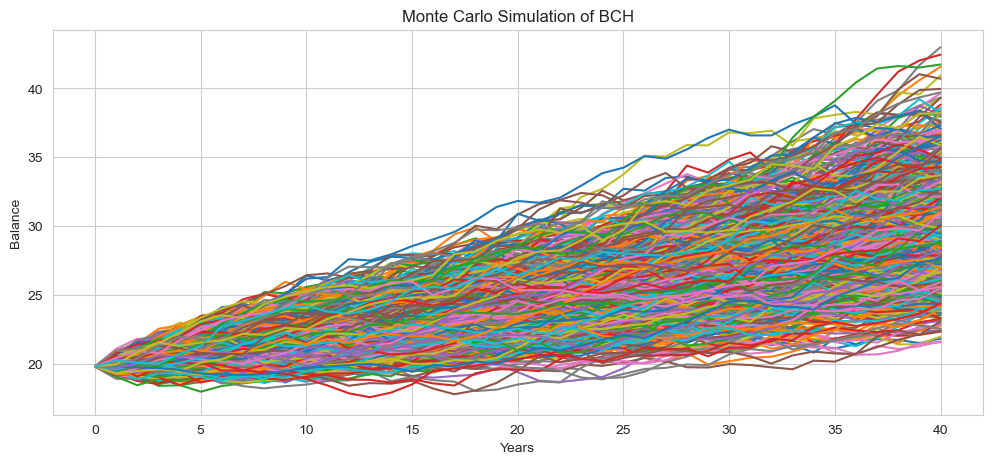

In [46]:
monte_carlo_simulation('BCH', 'en_US.UTF-8')

### BCH Monte Carlo Simulation Shape Distribution

BCH median stock price: $29.94
BCH stock price 90% confidence interval: ($24.67 : $36.29)


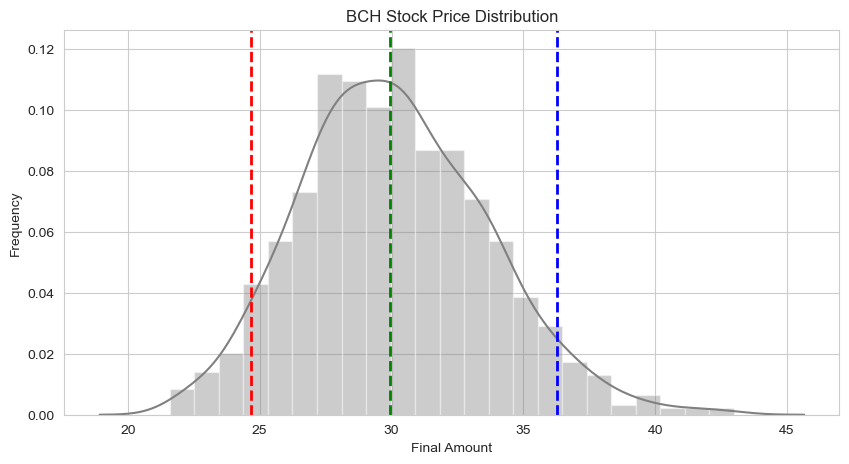

In [47]:
stock_price_distribution('BCH', 'en_US.UTF-8')

### Calculate BCH Return On Investment

In [48]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('BCH', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
BCH_FV_ZAR = FV_ZAR
BCH_capital_gain = capital_gain
BCH_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
BCH Return on investment: R151 803,49
BCH Capital gain/loss: R51 803,49
BCH Capital gain/loss percentage: 51.8%


### 3.2.4 Litecoin (LTC)

### LTC Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the LTC stock will go up.


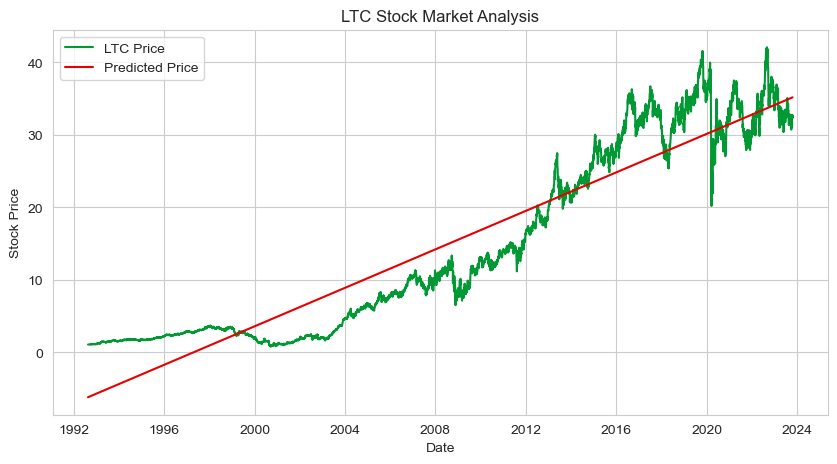

In [49]:
plot_stock_analysis('LTC', '#009933', 'up')

### LTC Monte Carlo Analysis

LTC expected stock price is: $48.73


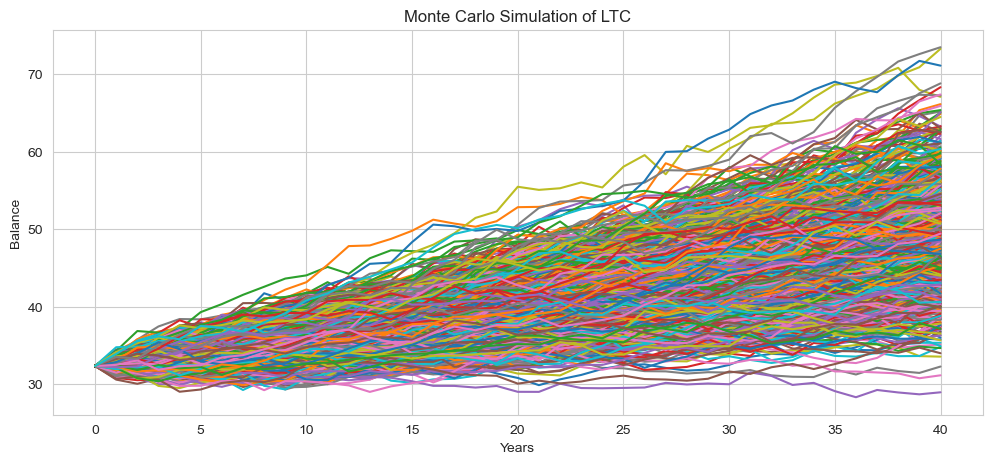

In [50]:
monte_carlo_simulation('LTC', 'en_US.UTF-8')

### LTC Monte Carlo Simulation Shape Distribution

LTC median stock price: $48.24
LTC stock price 90% confidence interval: ($39.36 : $59.83)


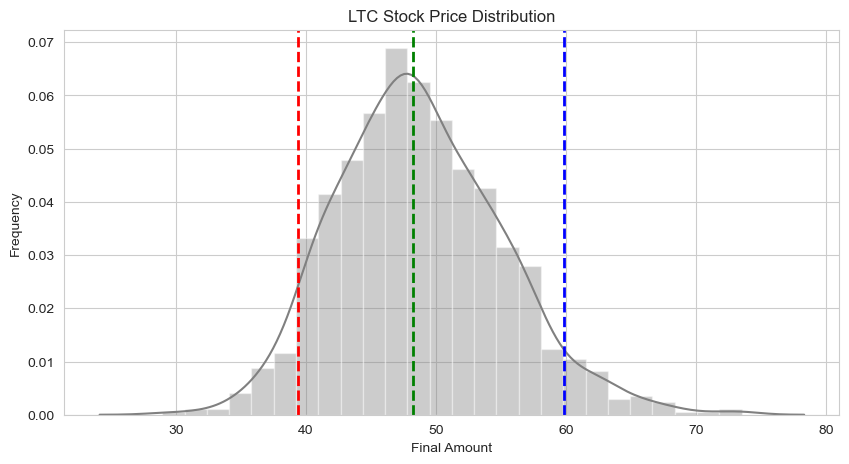

In [51]:
stock_price_distribution('LTC', 'en_US.UTF-8')

### Calculate LTC Return On Investment

In [52]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('LTC', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
LTC_FV_ZAR = FV_ZAR
LTC_capital_gain = capital_gain
LTC_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
LTC Return on investment: R150 628,14
LTC Capital gain/loss: R50 628,14
LTC Capital gain/loss percentage: 50.63%


### Compare Crypto Indexes

ChainLink is the index with the largest return on investment: R2 002 233,77 and capital gain percentage of 1902.23%


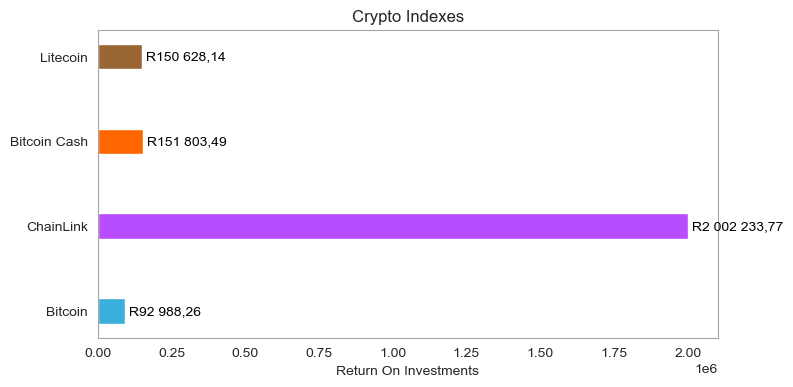

In [53]:
# Define financial market indexes
indexes = {
    'indexes': ['Bitcoin', 'ChainLink', 'Bitcoin Cash', 'Litecoin'],
    'prices': [BTC_FV_ZAR, LINK_FV_ZAR, BCH_FV_ZAR, LTC_FV_ZAR],
    'capital_gains': [BTC_capital_gain, LINK_capital_gain, BCH_capital_gain, LTC_capital_gain],
    'capital_gains_percentage': [BTC_capital_gain_percentage, LINK_capital_gain_percentage, BCH_capital_gain_percentage, LTC_capital_gain_percentage]
}

compare_stocks('Crypto', indexes, 'en_ZA.UTF-8')

# Store best stock for comparism with other stocks
crypto_largest_price_symbol = largest_price_symbol
crypto_largest_price_value = largest_price_value
crypto_largest_capital_gp = largest_capital_gp

## 3.3 Gold

### 3.3.1 Gold (GLD) Index Performance

### Gold Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the GLD stock will go up.


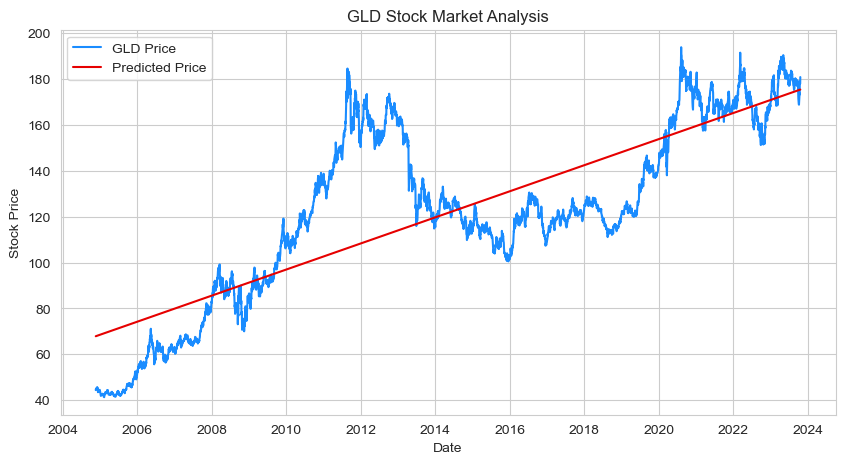

In [54]:
plot_stock_analysis('GLD', '#1a8cff', 'up')

### Gold Monte Carlo Analysis

GLD expected stock price is: $227.25


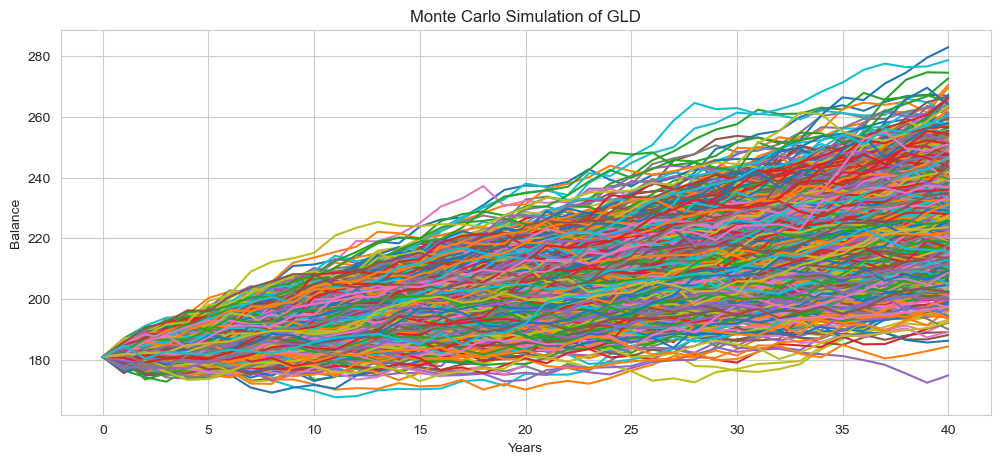

In [55]:
monte_carlo_simulation('GLD', 'en_US.UTF-8')

### Gold Monte Carlo Simulation Shape Distribution

GLD median stock price: $226.46
GLD stock price 90% confidence interval: ($201.78 : $254.75)


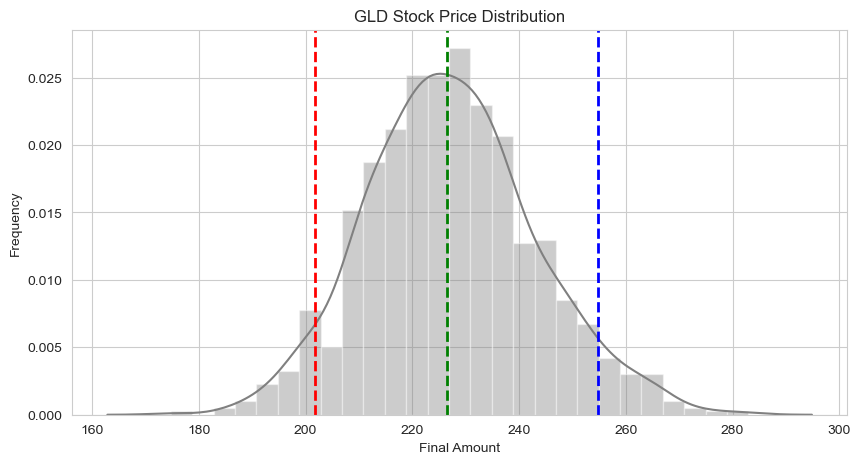

In [56]:
stock_price_distribution('GLD', 'en_US.UTF-8')

### Calculate Gold Return On Investment

In [57]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('GLD', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
GLD_FV_ZAR = FV_ZAR
GLD_capital_gain = capital_gain
GLD_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
GLD Return on investment: R125 645,45
GLD Capital gain/loss: R25 645,45
GLD Capital gain/loss percentage: 25.65%


### 3.3.2 iShares Gold Trust Index (IAU)

### IAU Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the IAU stock will go up.


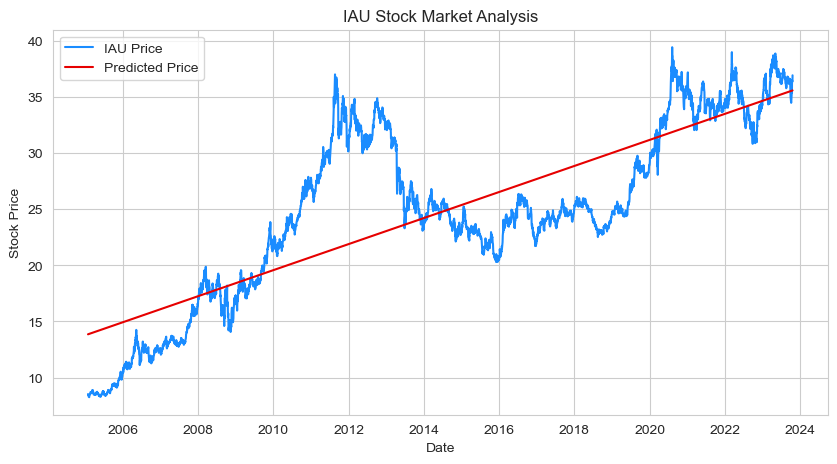

In [58]:
plot_stock_analysis('IAU', '#1a8cff', 'up')

### IAU Monte Carlo Analysis

IAU expected stock price is: $46.70


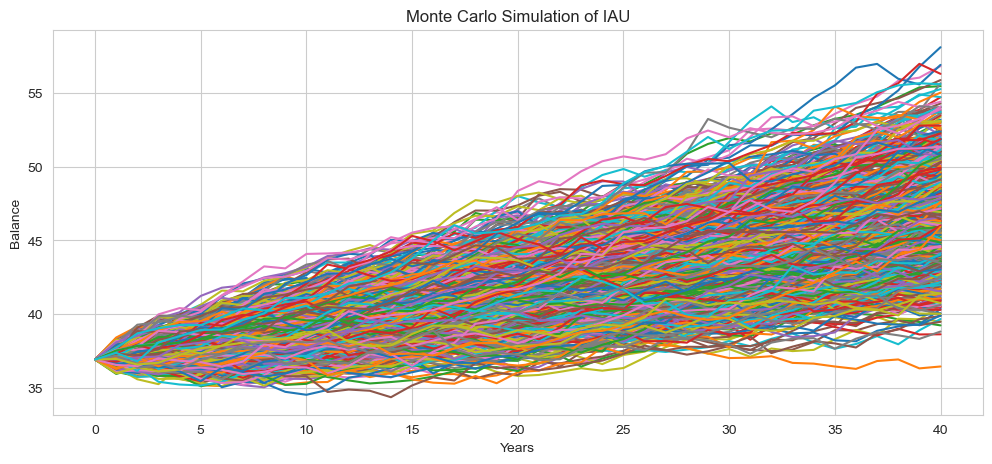

In [59]:
monte_carlo_simulation('IAU', 'en_US.UTF-8')

### IAU Monte Carlo Simulation Shape Distribution

IAU median stock price: $46.65
IAU stock price 90% confidence interval: ($41.71 : $52.16)


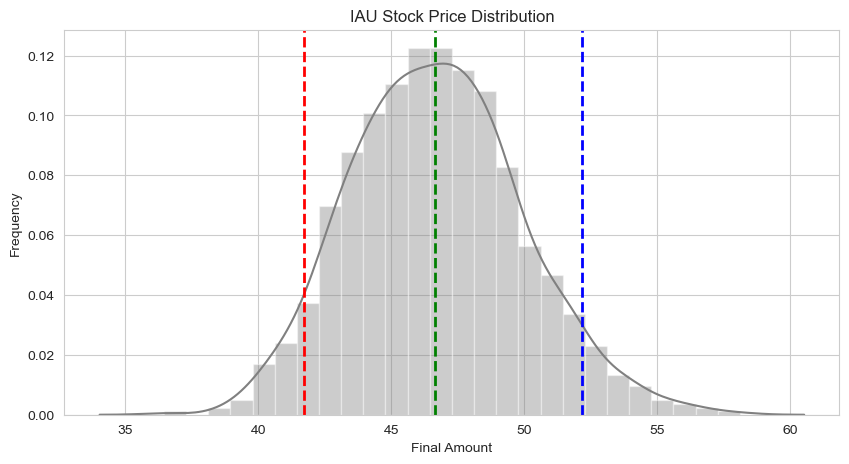

In [60]:
stock_price_distribution('IAU', 'en_US.UTF-8')

### Calculate IAU Return On Investment

In [61]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('IAU', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
IAU_FV_ZAR = FV_ZAR
IAU_capital_gain = capital_gain
IAU_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
IAU Return on investment: R126 482,83
IAU Capital gain/loss: R26 482,83
IAU Capital gain/loss percentage: 26.48%


### 3.3.3 VanEck Gold Miners ETF (GDX)

### GDX Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the GDX stock will go slightly down.


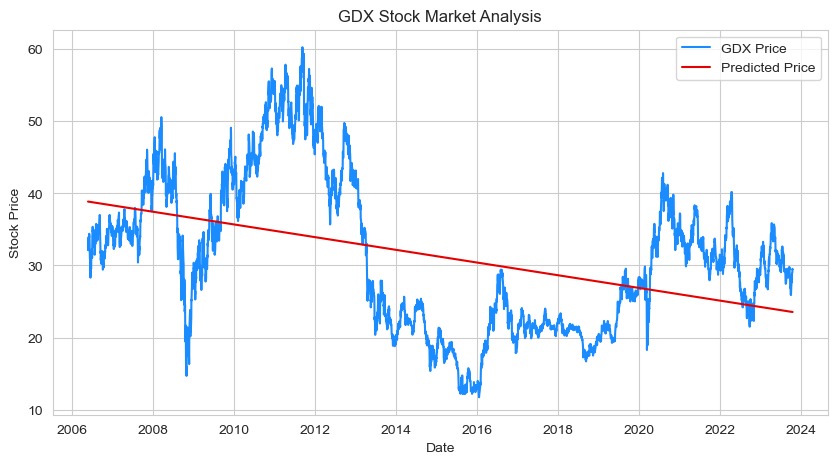

In [62]:
plot_stock_analysis('GDX', '#1a8cff', 'slightly down')

### GDX Monte Carlo Analysis

GDX expected stock price is: $36.14


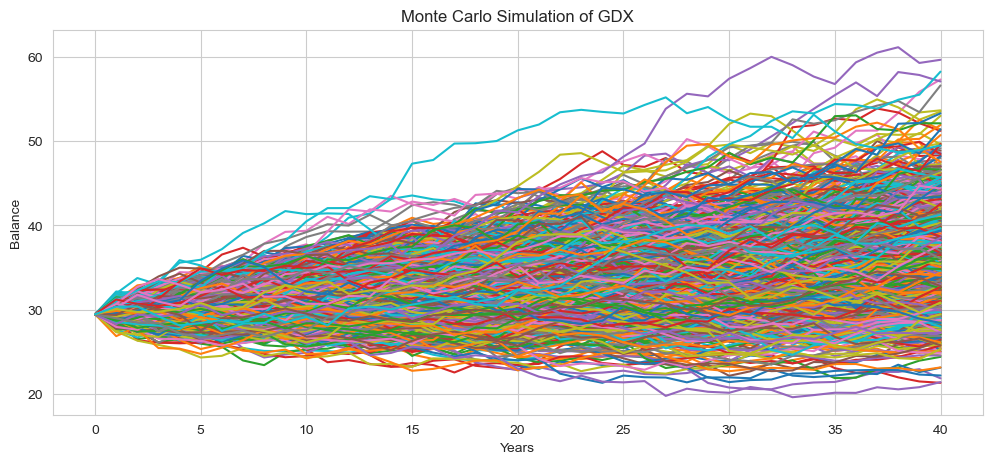

In [63]:
monte_carlo_simulation('GDX', 'en_US.UTF-8')

### GDX Monte Carlo Simulation Shape Distribution

GDX median stock price: $35.69
GDX stock price 90% confidence interval: ($27.30 : $46.04)


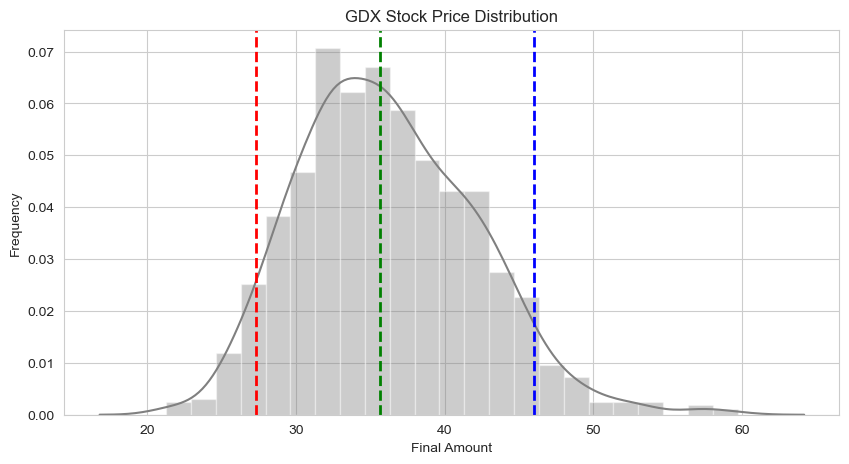

In [64]:
stock_price_distribution('GDX', 'en_US.UTF-8')

### Calculate GDX Return On Investment

In [65]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('GDX', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
GDX_FV_ZAR = FV_ZAR
GDX_capital_gain = capital_gain
GDX_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
GDX Return on investment: R122 724,42
GDX Capital gain/loss: R22 724,42
GDX Capital gain/loss percentage: 22.72%


### 3.3.4 VanEck Junior Gold Miners ETF (GDXJ)

### GDXJ Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the GDXJ stock will go slightly down.


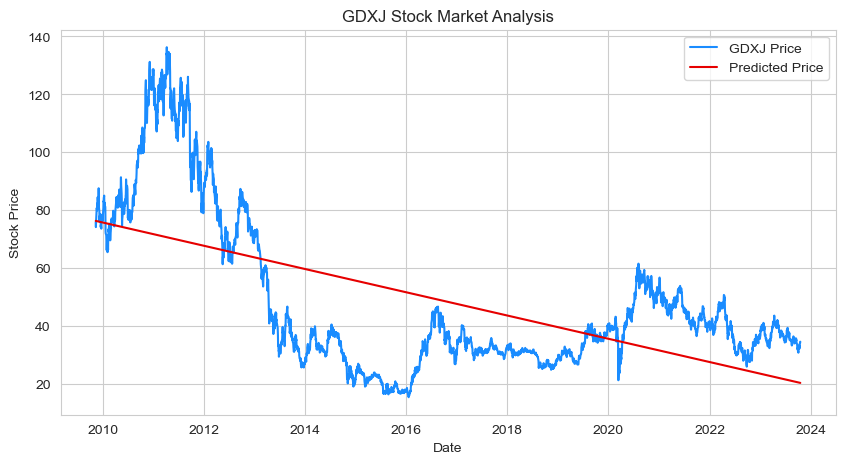

In [66]:
plot_stock_analysis('GDXJ', '#1a8cff', 'slightly down')

### GDXJ Monte Carlo Analysis

GDXJ expected stock price is: $39.44


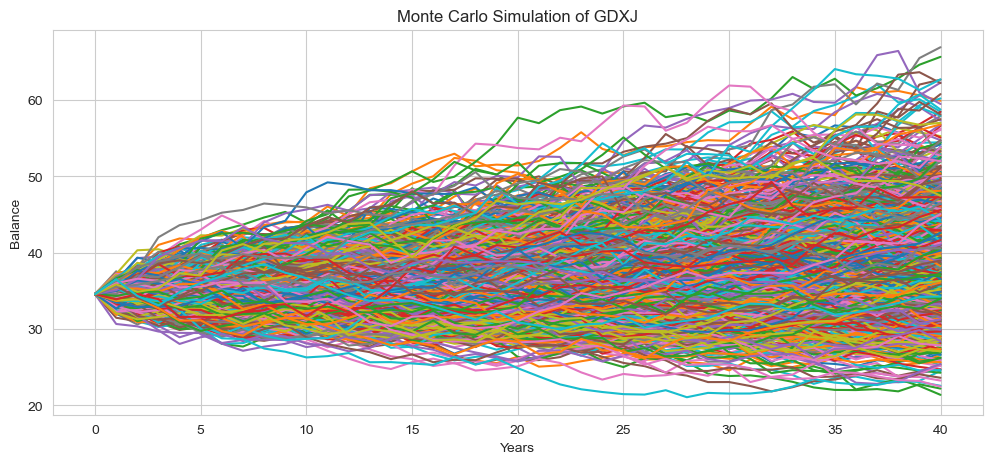

In [67]:
monte_carlo_simulation('GDXJ', 'en_US.UTF-8')

### GDXJ Monte Carlo Simulation Shape Distribution

GDXJ median stock price: $38.97
GDXJ stock price 90% confidence interval: ($28.15 : $52.45)


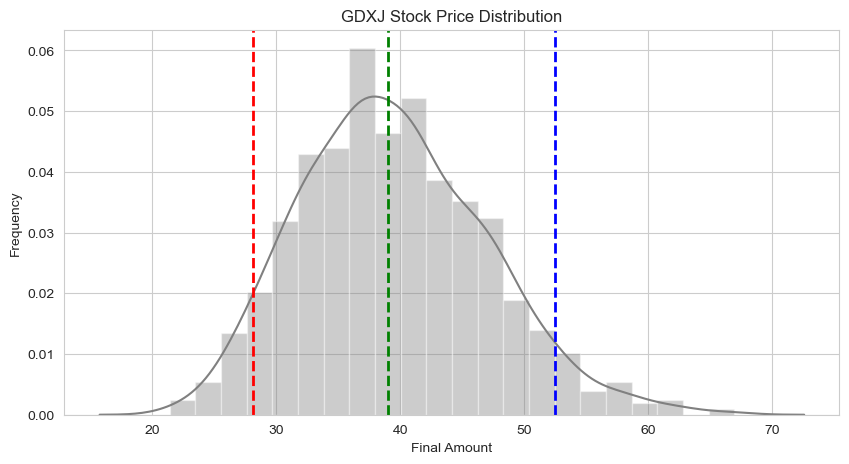

In [68]:
stock_price_distribution('GDXJ', 'en_US.UTF-8')

### Calculate GDXJ Return On Investment

In [69]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('GDXJ', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
GDXJ_FV_ZAR = FV_ZAR
GDXJ_capital_gain = capital_gain
GDXJ_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
GDXJ Return on investment: R114 061,19
GDXJ Capital gain/loss: R14 061,19
GDXJ Capital gain/loss percentage: 14.06%


### 3.3.5 Sprott Gold Miners ETF (SGDM)

### SGDM Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the SGDM stock will go up.


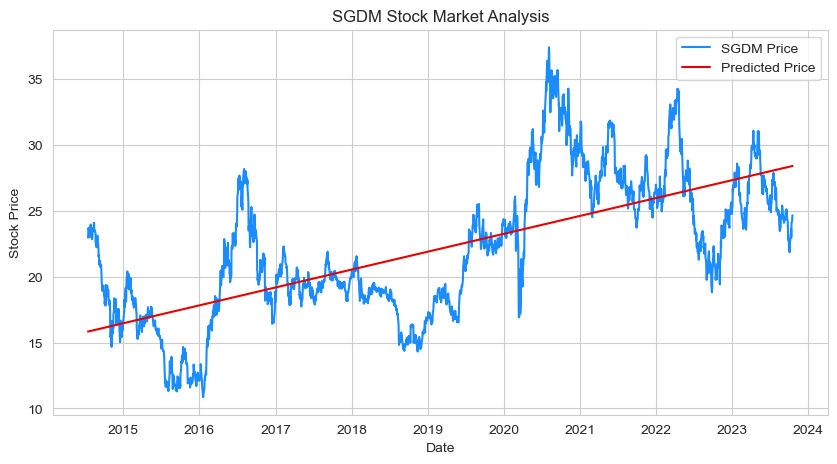

In [70]:
plot_stock_analysis('SGDM', '#1a8cff', 'up')

### SGDM Monte Carlo Analysis

SGDM expected stock price is: $30.50


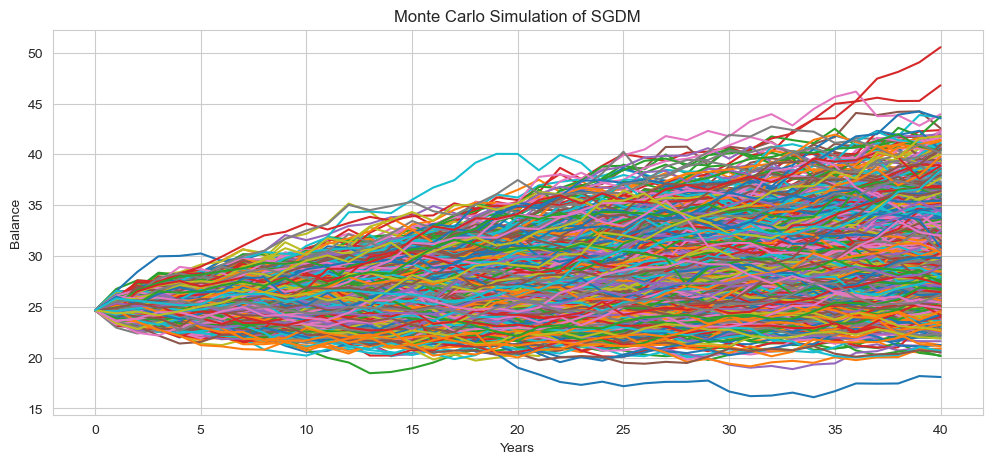

In [71]:
monte_carlo_simulation('SGDM', 'en_US.UTF-8')

### SGDM Monte Carlo Simulation Shape Distribution

SGDM median stock price: $29.98
SGDM stock price 90% confidence interval: ($23.53 : $39.55)


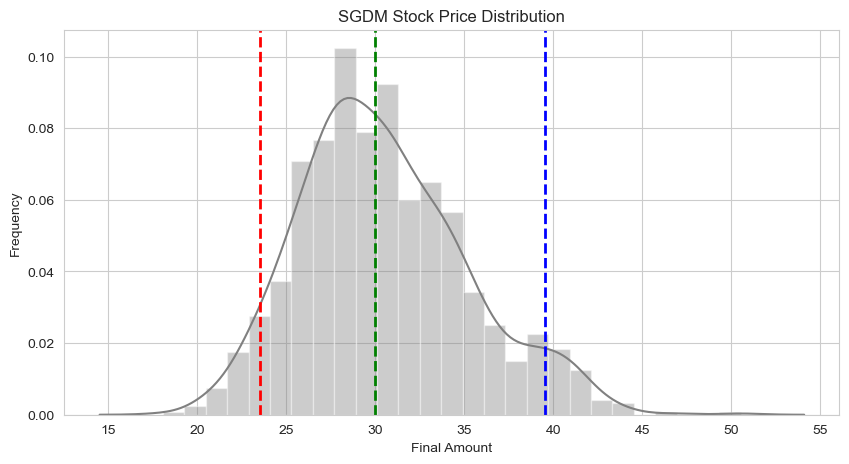

In [72]:
stock_price_distribution('SGDM', 'en_US.UTF-8')

### Calculate SGDM Return On Investment

In [73]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('SGDM', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
SGDM_FV_ZAR = FV_ZAR
SGDM_capital_gain = capital_gain
SGDM_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
SGDM Return on investment: R123 688,09
SGDM Capital gain/loss: R23 688,09
SGDM Capital gain/loss percentage: 23.69%


### 3.3.6 Sprott Junior Gold Miners ETF (SGDJ)

### SGDJ Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the SGDJ stock will go slightly up.


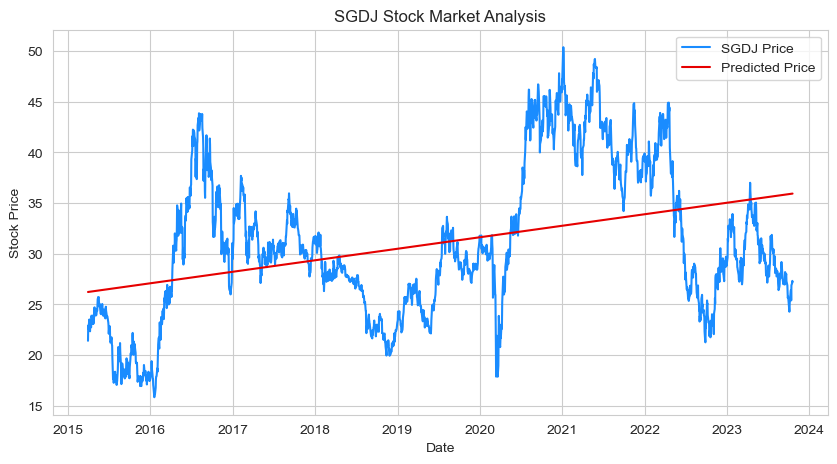

In [74]:
plot_stock_analysis('SGDJ', '#1a8cff', 'slightly up')

### SGDJ Monte Carlo Analysis

SGDJ expected stock price is: $36.65


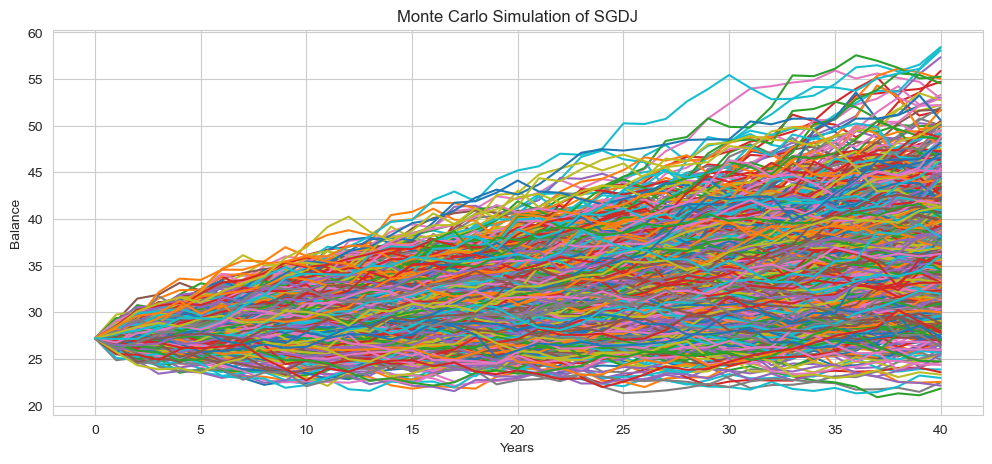

In [75]:
monte_carlo_simulation('SGDJ', 'en_US.UTF-8')

In [76]:
### SGDJ Monte Carlo Simulation Shape Distribution

SGDJ median stock price: $36.05
SGDJ stock price 90% confidence interval: ($27.40 : $48.07)


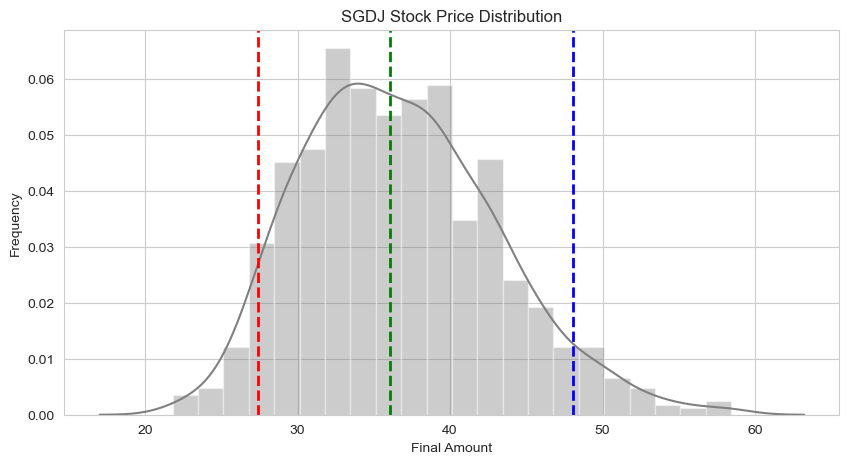

In [77]:
stock_price_distribution('SGDJ', 'en_US.UTF-8')

### Calculate SGDJ Return On Investment

In [78]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('SGDJ', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
SGDJ_FV_ZAR = FV_ZAR
SGDJ_capital_gain = capital_gain
SGDJ_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
SGDJ Return on investment: R134 661,71
SGDJ Capital gain/loss: R34 661,71
SGDJ Capital gain/loss percentage: 34.66%


### Compare Gold Indexes

Sprott Junior Gold Miners is the index with the largest return on investment: R134 661,71 and capital gain percentage of 34.66%


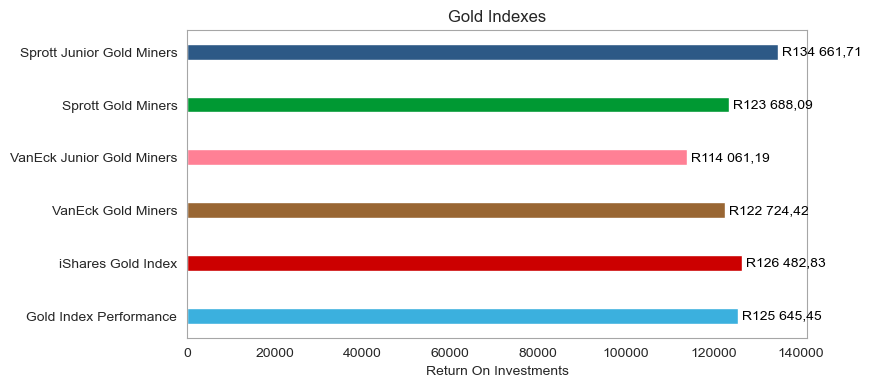

In [79]:
# Define financial market indexes
indexes = {
    'indexes': ['Gold Index Performance', 'iShares Gold Index', 'VanEck Gold Miners', 'VanEck Junior Gold Miners', 'Sprott Gold Miners', 'Sprott Junior Gold Miners'],
    'prices': [GLD_FV_ZAR, IAU_FV_ZAR, GDX_FV_ZAR, GDXJ_FV_ZAR, SGDM_FV_ZAR, SGDJ_FV_ZAR],
    'capital_gains': [GLD_capital_gain, IAU_capital_gain, GDX_capital_gain, GDXJ_capital_gain, SGDM_capital_gain, SGDJ_capital_gain],
    'capital_gains_percentage': [GLD_capital_gain_percentage, IAU_capital_gain_percentage, GDX_capital_gain_percentage, GDXJ_capital_gain_percentage, SGDM_capital_gain_percentage, SGDJ_capital_gain_percentage]
}

compare_stocks('Gold', indexes, 'en_ZA.UTF-8')

# Store best stock for comparism with other stocks
gold_largest_price_symbol = largest_price_symbol
gold_largest_price_value = largest_price_value
gold_largest_capital_gp = largest_capital_gp

## 3.4 Fidelity ® International Index Fund

### 3.4.1 Fidelity ® International Index Fund (FSPSX)

### FSPSX Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the FSPSX stock will go up.


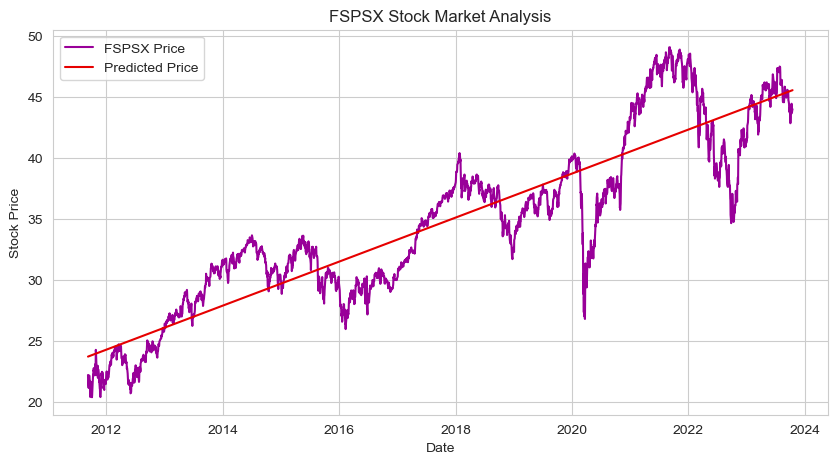

In [80]:
plot_stock_analysis('FSPSX', '#990099', 'up')

### FSPSX Monte Carlo Analysis

FSPSX expected stock price is: $52.63


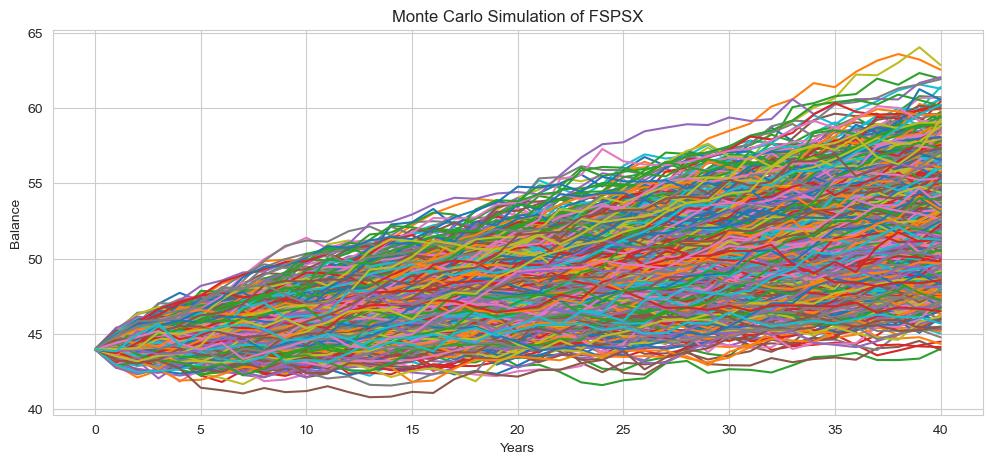

In [81]:
monte_carlo_simulation('FSPSX', 'en_US.UTF-8')

### FSPSX Monte Carlo Simulation Shape Distribution

FSPSX median stock price: $52.46
FSPSX stock price 90% confidence interval: ($47.21 : $58.53)


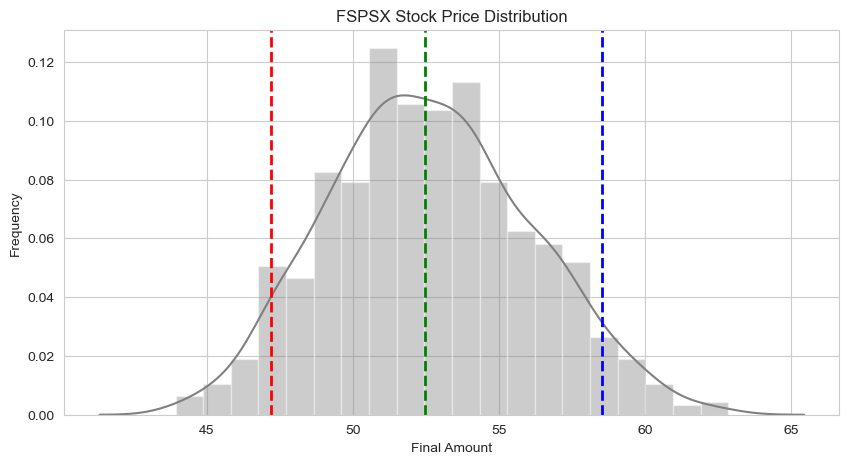

In [82]:
stock_price_distribution('FSPSX', 'en_US.UTF-8')

### Calculate FSPSX Return On Investment

In [83]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('FSPSX', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
FSPSX_FV_ZAR = FV_ZAR
FSPSX_capital_gain = capital_gain
FSPSX_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
FSPSX Return on investment: R119 692,63
FSPSX Capital gain/loss: R19 692,63
FSPSX Capital gain/loss percentage: 19.69%


### 3.4.2 Fidelity ® 500 Index Fund (FSIIX)

### FSIIX Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the FSIIX stock will go slightly up.


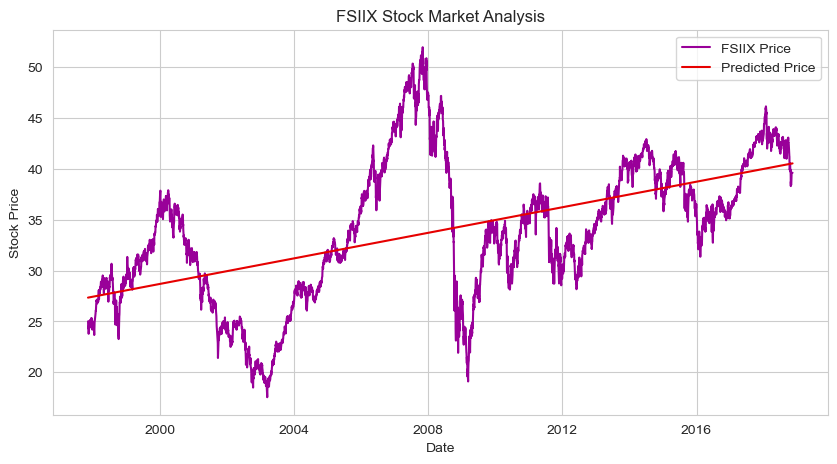

In [84]:
plot_stock_analysis('FSIIX', '#990099', 'slightly up')

### FSIIX Monte Carlo Analysis

FSIIX expected stock price is: $43.95


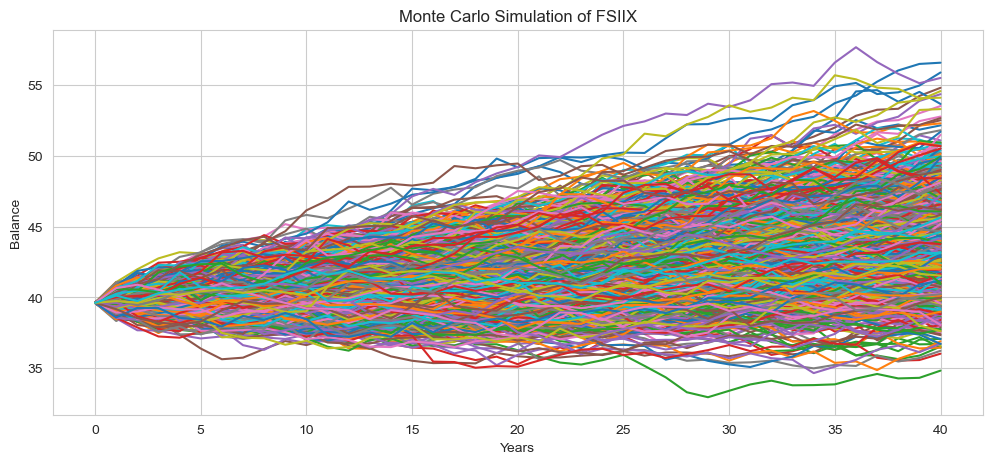

In [85]:
monte_carlo_simulation('FSIIX', 'en_US.UTF-8')

### FSIIX Monte Carlo Simulation Shape Distribution

FSIIX median stock price: $43.75
FSIIX stock price 90% confidence interval: ($38.83 : $49.45)


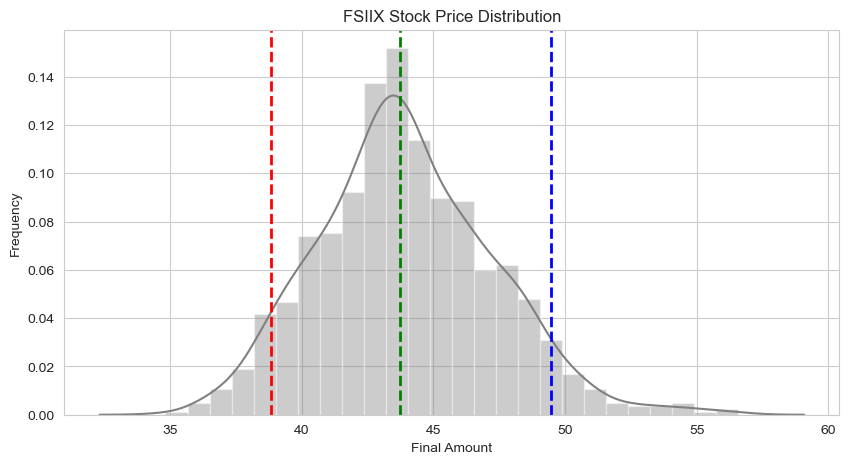

In [86]:
stock_price_distribution('FSIIX', 'en_US.UTF-8')

### Calculate FSIIX Return On Investment

In [87]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('FSIIX', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
FSIIX_FV_ZAR = FV_ZAR
FSIIX_capital_gain = capital_gain
FSIIX_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
FSIIX Return on investment: R110 932,92
FSIIX Capital gain/loss: R10 932,92
FSIIX Capital gain/loss percentage: 10.93%


### 3.4.3 Fidelity International Index Instl (FSPNX)

### FSPNX Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the FSPNX stock will go up.


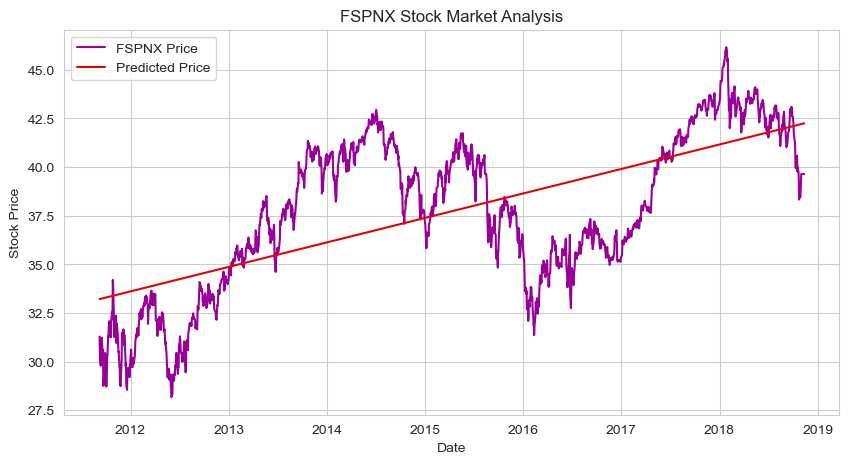

In [88]:
plot_stock_analysis('FSPNX', '#990099', 'up')

### FSPNX Monte Carlo Analysis

FSPNX expected stock price is: $44.36


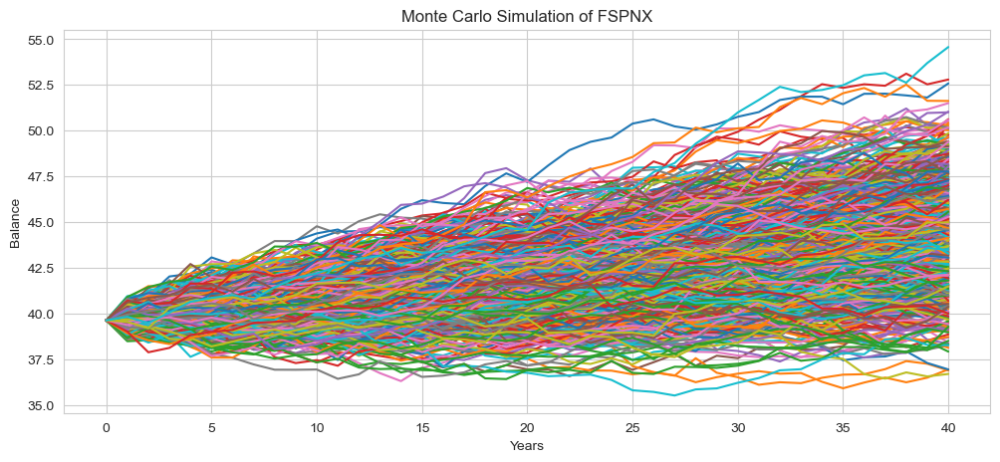

In [89]:
monte_carlo_simulation('FSPNX', 'en_US.UTF-8')

### FSPNX Monte Carlo Simulation Shape Distribution

FSPNX median stock price: $44.31
FSPNX stock price 90% confidence interval: ($40.28 : $48.89)


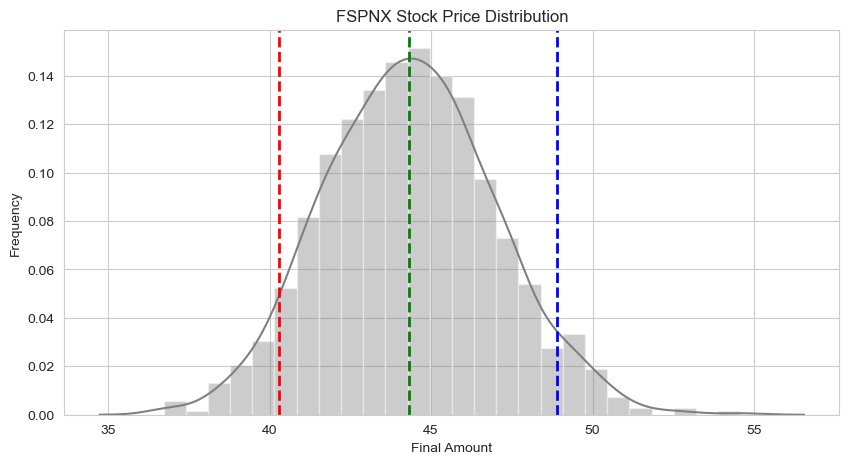

In [90]:
stock_price_distribution('FSPNX', 'en_US.UTF-8')

### Calculate FSPNX Return On Investment

In [91]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('FSPNX', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
FSPNX_FV_ZAR = FV_ZAR
FSPNX_capital_gain = capital_gain
FSPNX_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
FSPNX Return on investment: R111 895,11
FSPNX Capital gain/loss: R11 895,11
FSPNX Capital gain/loss percentage: 11.9%


### 3.4.4 Fidelity ® Europe Fund (FIEUX)

### FIEUX Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the FIEUX stock will go up.


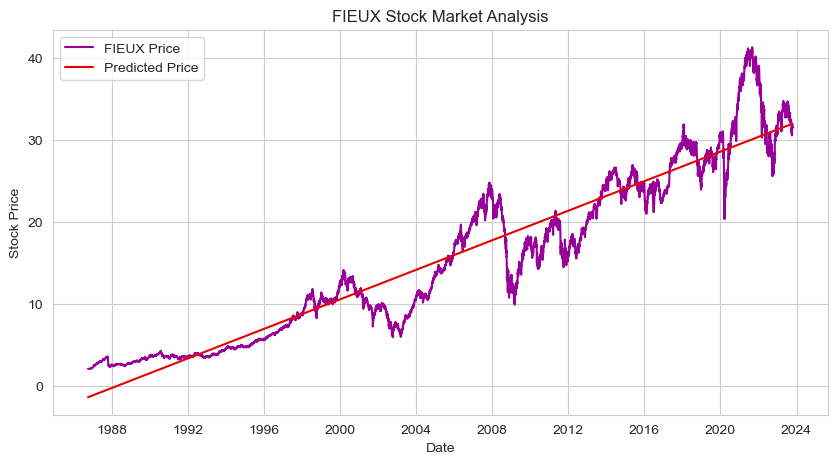

In [92]:
plot_stock_analysis('FIEUX', '#990099', 'up')

### FIEUX Monte Carlo Analysis

FIEUX expected stock price is: $39.71


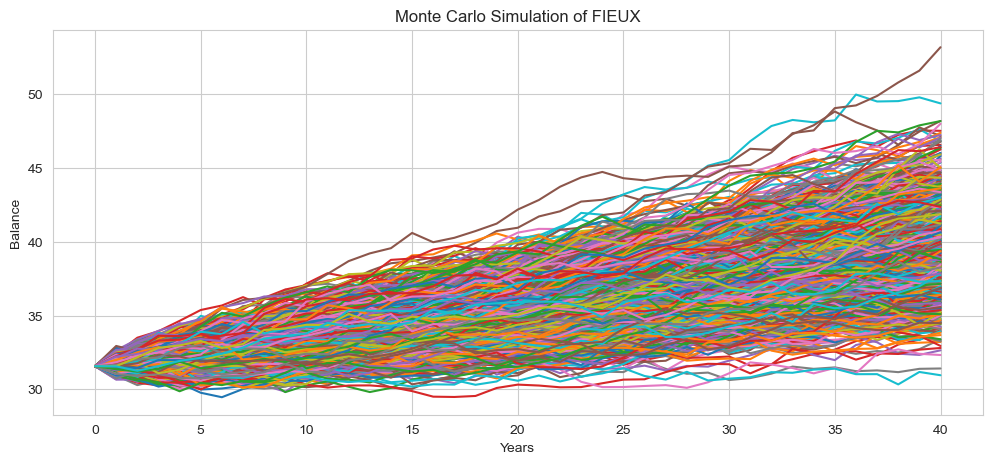

In [93]:
monte_carlo_simulation('FIEUX', 'en_US.UTF-8')

### FIEUX Monte Carlo Simulation Shape Distribution

FIEUX median stock price: $39.52
FIEUX stock price 90% confidence interval: ($34.99 : $44.70)


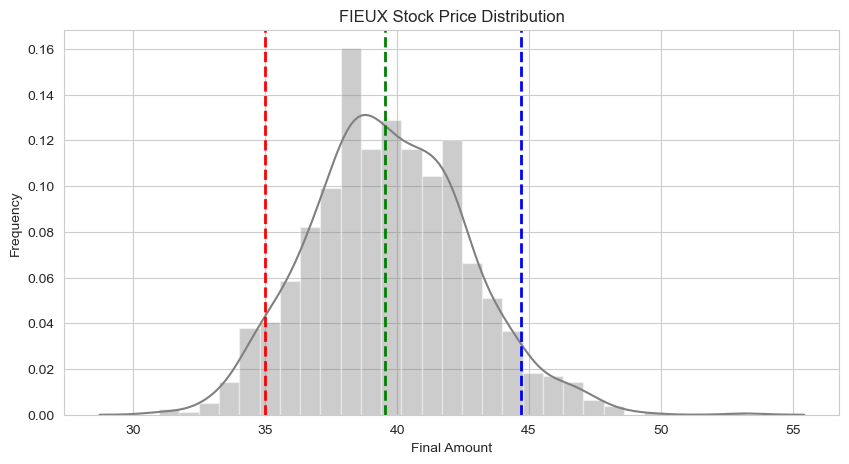

In [94]:
stock_price_distribution('FIEUX', 'en_US.UTF-8')

### Calculate FIEUX Return On Investment

In [95]:
# 1 USD = 18.7735 ZAR  
calculate_return_on_investment('FIEUX', 18.7735, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
FIEUX_FV_ZAR = FV_ZAR
FIEUX_capital_gain = capital_gain
FIEUX_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
FIEUX Return on investment: R125 782,27
FIEUX Capital gain/loss: R25 782,27
FIEUX Capital gain/loss percentage: 25.78%


### Compare Fidelity ® International Index Fund Indexes

Fidelity Europe Fund is the index with the largest return on investment: R125 782,27 and capital gain percentage of 25.78%


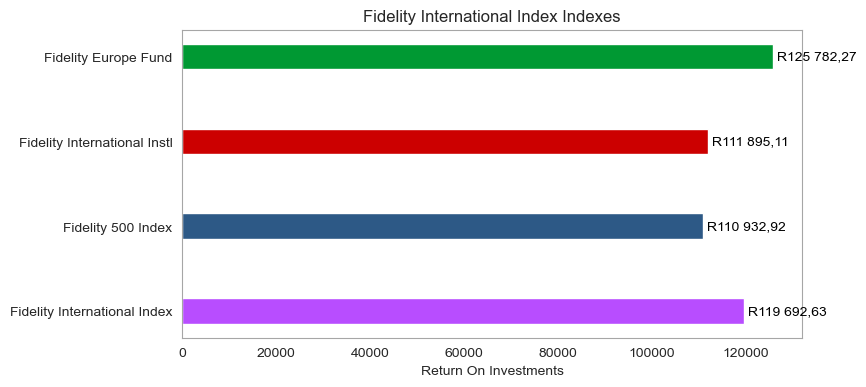

In [96]:
# Define financial market indexes
indexes = {
    'indexes': ['Fidelity International Index', 'Fidelity 500 Index', 'Fidelity International Instl', 'Fidelity Europe Fund'],
    'prices': [FSPSX_FV_ZAR, FSIIX_FV_ZAR, FSPNX_FV_ZAR, FIEUX_FV_ZAR],
    'capital_gains': [FSPSX_capital_gain, FSIIX_capital_gain, FSPNX_capital_gain, FIEUX_capital_gain],
    'capital_gains_percentage': [FSPSX_capital_gain_percentage, FSIIX_capital_gain_percentage, FSPNX_capital_gain_percentage, FIEUX_capital_gain_percentage]
}

compare_stocks('Fidelity International Index', indexes, 'en_ZA.UTF-8')

# Store best stock for comparism with other stocks
fidelity_largest_price_symbol = largest_price_symbol
fidelity_largest_price_value = largest_price_value
fidelity_largest_capital_gp = largest_capital_gp

## 3.5 Satrix Top 40

### 3.5.1 BHP Group Ltd (BHP)

### BHP Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the BHP stock will go up.


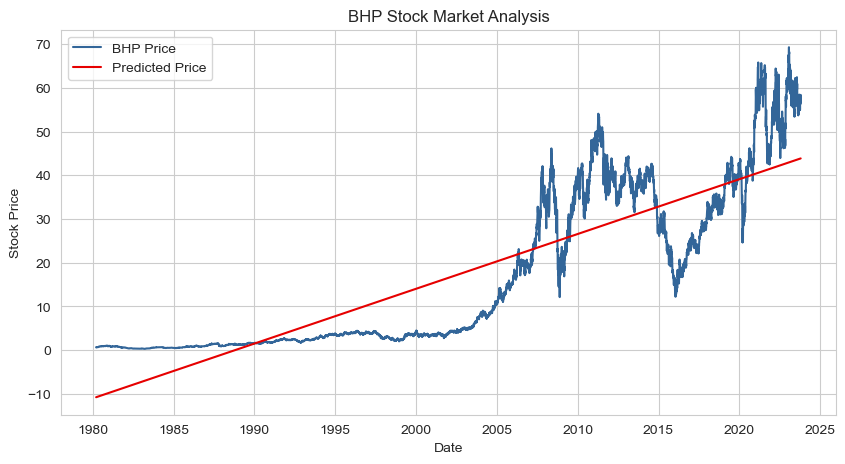

In [97]:
plot_stock_analysis('BHP', '#336699', 'up')

### BHP Monte Carlo Analysis

BHP expected stock price is: R85,55


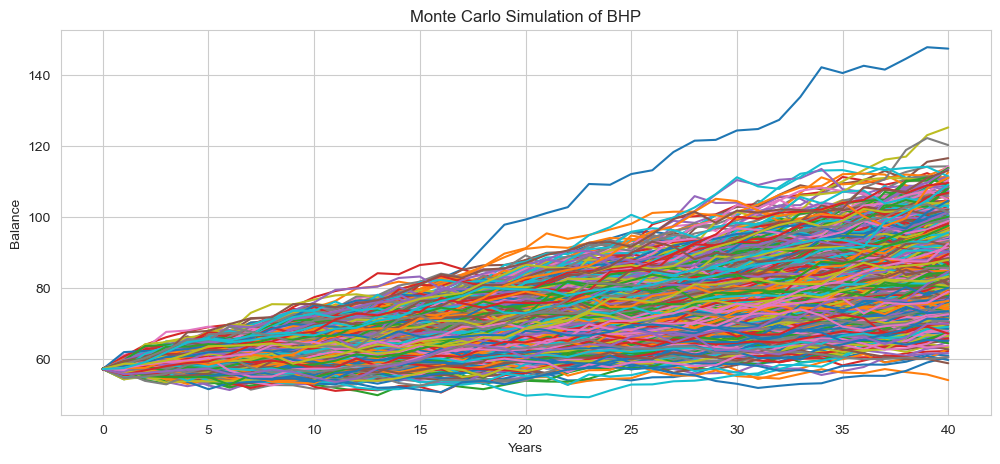

In [98]:
monte_carlo_simulation('BHP', 'en_ZA.UTF-8')

### BHP Monte Carlo Simulation Shape Distribution

BHP median stock price: R84,72
BHP stock price 90% confidence interval: (R68,86 : R104,65)


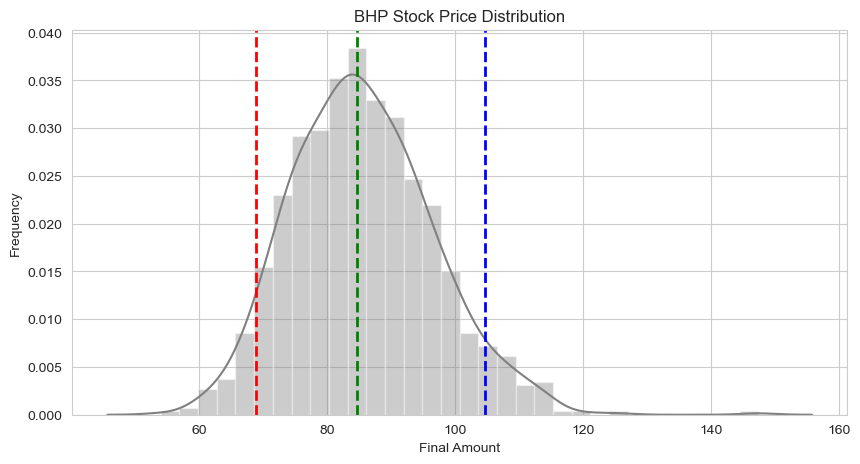

In [99]:
stock_price_distribution('BHP', 'en_ZA.UTF-8')

### Calculate BHP Return On Investment

In [100]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('BHP', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
BHP_FV_ZAR = FV_ZAR
BHP_capital_gain = capital_gain
BHP_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
BHP Return on investment: R149 698,08
BHP Capital gain/loss: R49 698,08
BHP Capital gain/loss percentage: 49.7%


### 3.5.2 Richemont (CFR)

### CFR Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the CFR stock will go up.


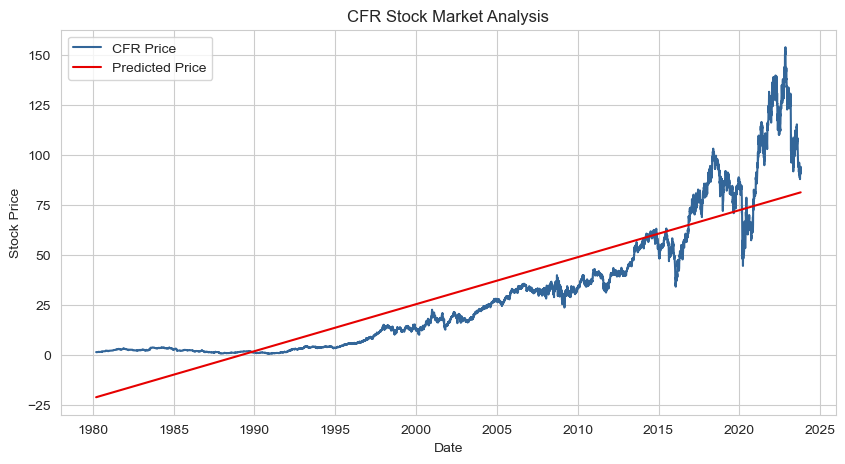

In [101]:
plot_stock_analysis('CFR', '#336699', 'up')

### CFR Monte Carlo Analysis

CFR expected stock price is: R132,88


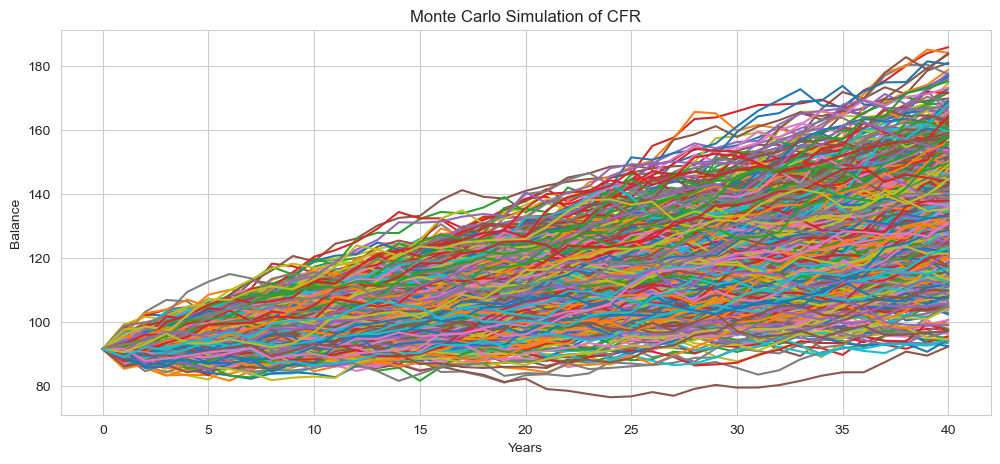

In [102]:
monte_carlo_simulation('CFR', 'en_ZA.UTF-8')

### CFR Monte Carlo Simulation Shape Distribution

CFR median stock price: R131,57
CFR stock price 90% confidence interval: (R106,99 : R162,33)


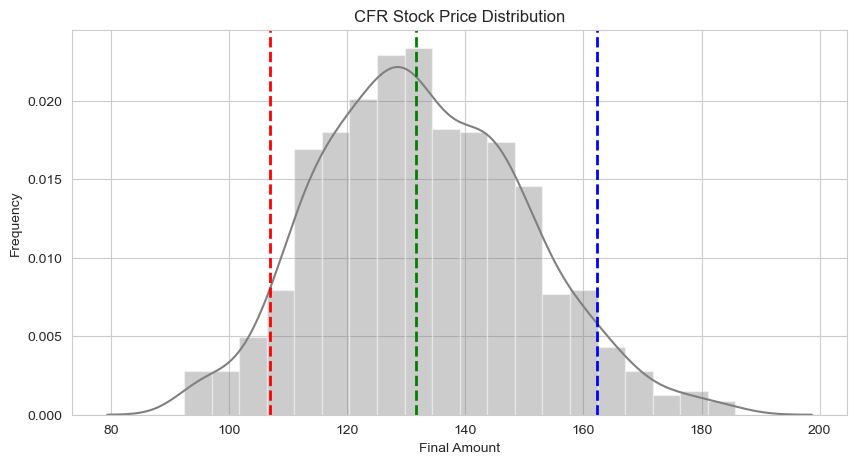

In [103]:
stock_price_distribution('CFR', 'en_ZA.UTF-8')

### Calculate CFR Return On Investment

In [104]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('CFR', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
CFR_FV_ZAR = FV_ZAR
CFR_capital_gain = capital_gain
CFR_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
CFR Return on investment: R145 177,92
CFR Capital gain/loss: R45 177,92
CFR Capital gain/loss percentage: 45.18%


### 3.5.3 Shoprite Holdings (SHP)

### SHP Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the SHP stock will go up.


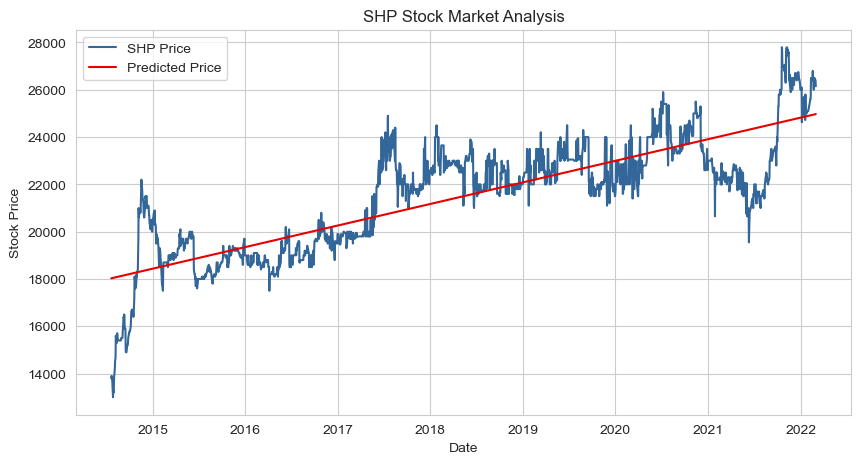

In [105]:
plot_stock_analysis('SHP', '#336699', 'up')

### SHP Monte Carlo Analysis

SHP expected stock price is: R36 042,52


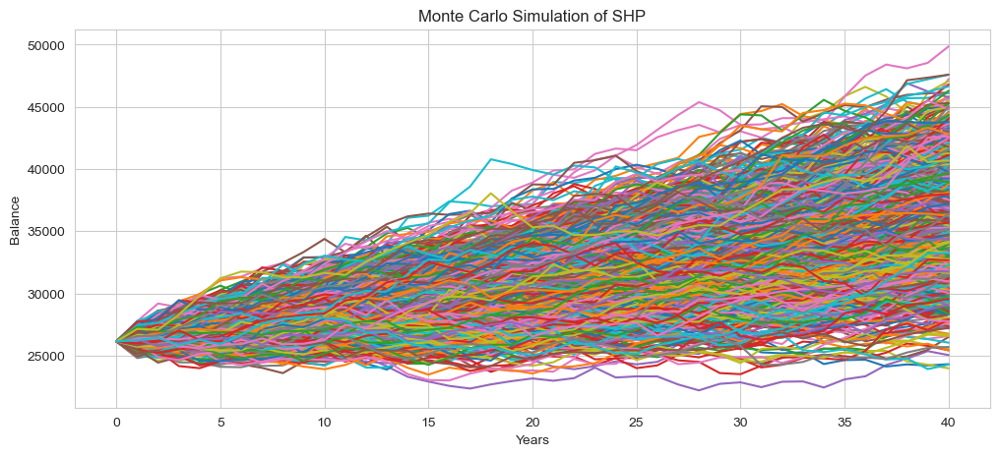

In [106]:
monte_carlo_simulation('SHP', 'en_ZA.UTF-8')

### SHP Monte Carlo Simulation Shape Distribution

SHP median stock price: R35 944,32
SHP stock price 90% confidence interval: (R28 927,80 : R43 456,82)


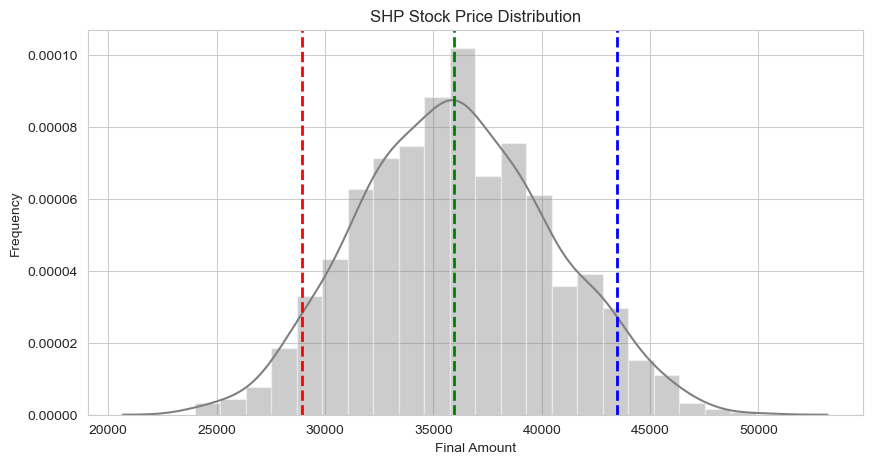

In [107]:
stock_price_distribution('SHP', 'en_ZA.UTF-8')

### Calculate SHP Return On Investment

In [108]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('SHP', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
SHP_FV_ZAR = FV_ZAR
SHP_capital_gain = capital_gain
SHP_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
SHP Return on investment: R137 829,92
SHP Capital gain/loss: R37 829,92
SHP Capital gain/loss percentage: 37.83%


### 3.5.4 Impala Platinum Holdings (IMP)

### IMP Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the IMP stock will go up.


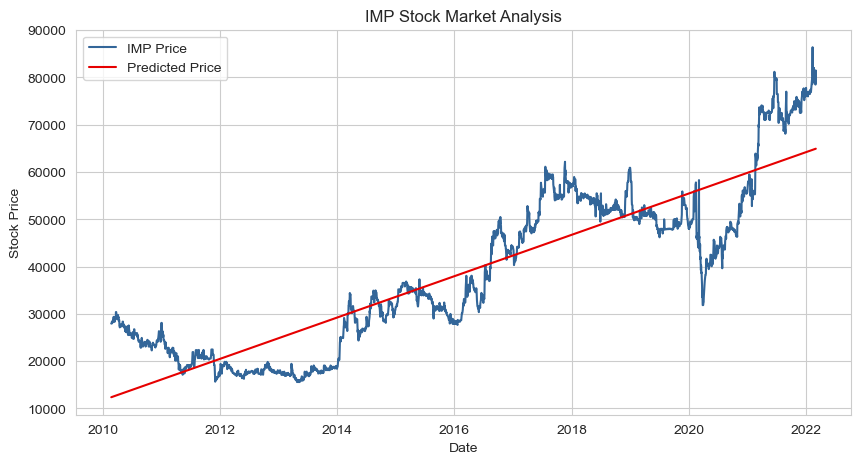

In [109]:
plot_stock_analysis('IMP', '#336699', 'up')

### IMP Monte Carlo Analysis

IMP expected stock price is: R111 471,22


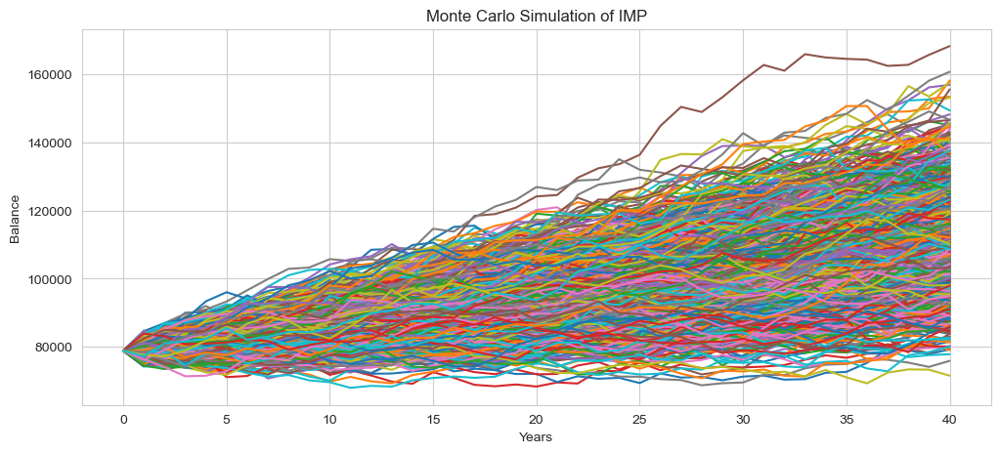

In [110]:
monte_carlo_simulation('IMP', 'en_ZA.UTF-8')

### IMP Monte Carlo Simulation Shape Distribution

IMP median stock price: R110 415,40
IMP stock price 90% confidence interval: (R88 564,00 : R137 014,53)


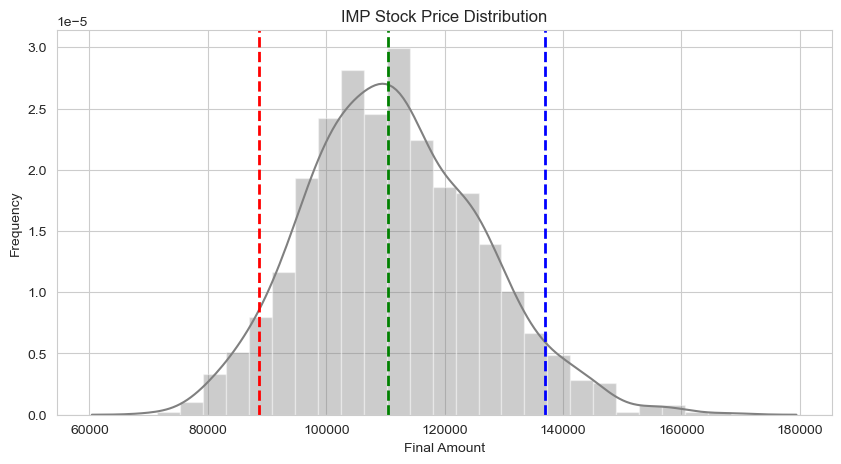

In [111]:
stock_price_distribution('IMP', 'en_ZA.UTF-8')

### Calculate IMP Return On Investment

In [112]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('IMP', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
IMP_FV_ZAR = FV_ZAR
IMP_capital_gain = capital_gain
IMP_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
IMP Return on investment: R141 460,94
IMP Capital gain/loss: R41 460,94
IMP Capital gain/loss percentage: 41.46%


### 3.5.5 Absa Group Limited (ABG)

### ABG Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the ABG stock will go up.


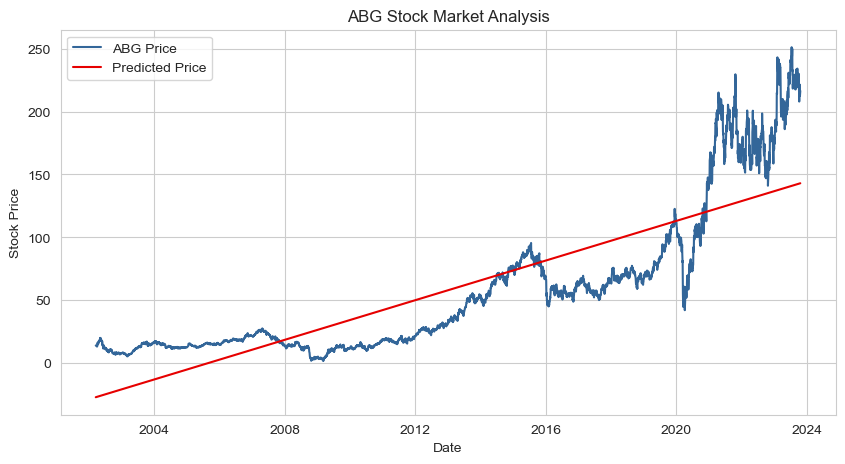

In [113]:
plot_stock_analysis('ABG', '#336699', 'up')

### ABG Monte Carlo Analysis

ABG expected stock price is: R422,92


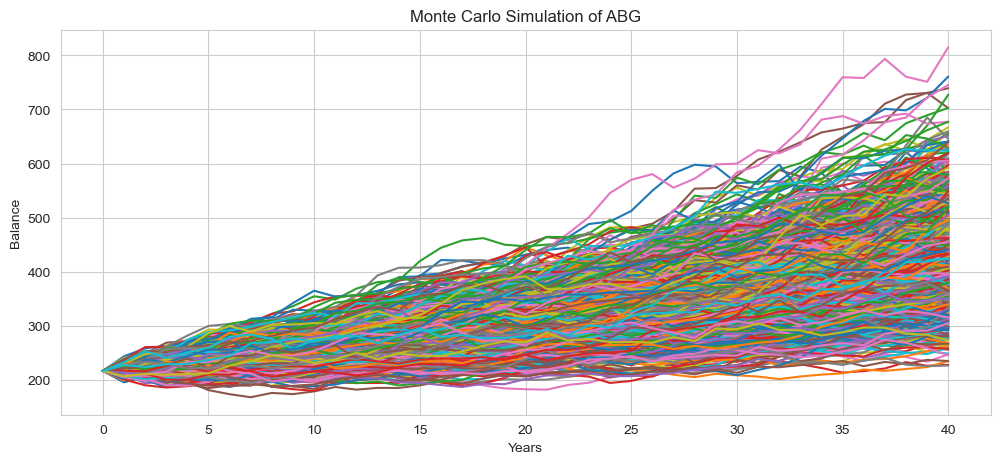

In [114]:
monte_carlo_simulation('ABG', 'en_ZA.UTF-8')

### ABG Monte Carlo Simulation Shape Distribution

ABG median stock price: R414,64
ABG stock price 90% confidence interval: (R296,89 : R580,60)


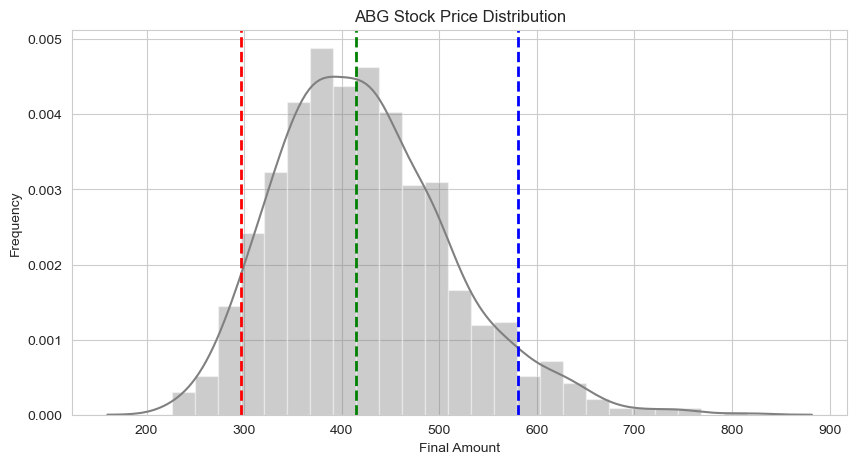

In [115]:
stock_price_distribution('ABG', 'en_ZA.UTF-8')

### Calculate ABG Return On Investment

In [116]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('ABG', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
ABG_FV_ZAR = FV_ZAR
ABG_capital_gain = capital_gain
ABG_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
ABG Return on investment: R195 354,53
ABG Capital gain/loss: R95 354,53
ABG Capital gain/loss percentage: 95.35%


### 3.5.6 Sappi Limited (SAP)

### SAP Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the SAP stock will go up.


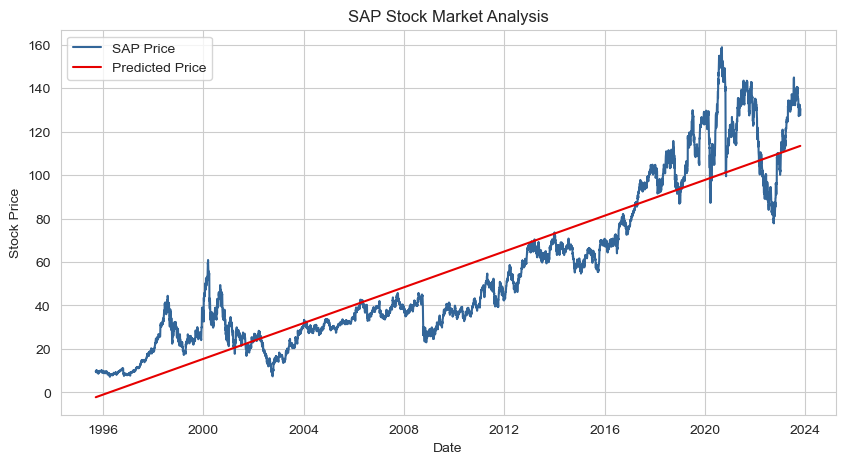

In [117]:
plot_stock_analysis('SAP', '#336699', 'up')

### SAP Monte Carlo Analysis

SAP expected stock price is: R193,05


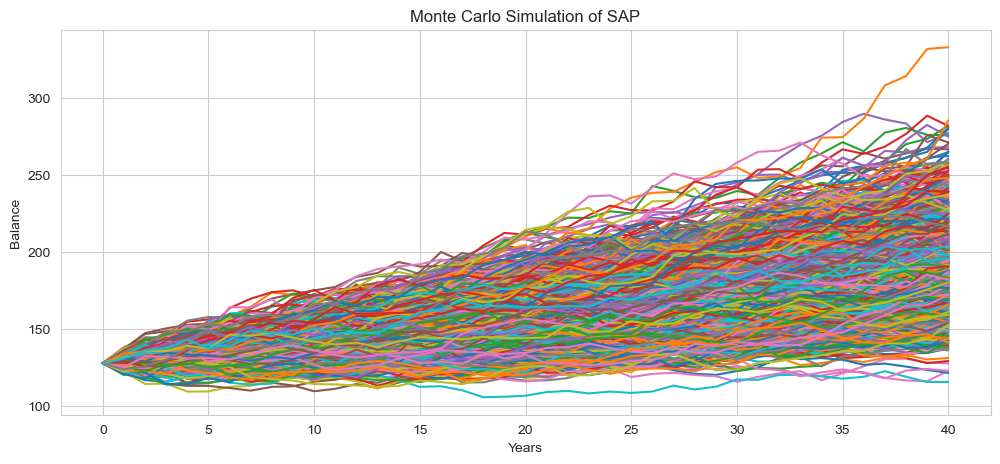

In [118]:
monte_carlo_simulation('SAP', 'en_ZA.UTF-8')

### SAP Monte Carlo Simulation Shape Distribution

SAP median stock price: R191,45
SAP stock price 90% confidence interval: (R149,21 : R246,08)


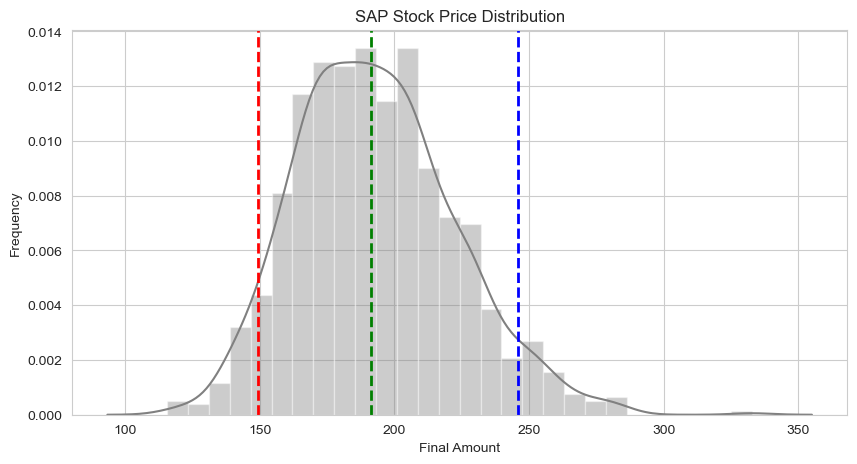

In [119]:
stock_price_distribution('SAP', 'en_ZA.UTF-8')

### Calculate SAP Return On Investment

In [120]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('SAP', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
SAP_FV_ZAR = FV_ZAR
SAP_capital_gain = capital_gain
SAP_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
SAP Return on investment: R151 279,74
SAP Capital gain/loss: R51 279,74
SAP Capital gain/loss percentage: 51.28%


### 3.5.7 RCL Foods (RCL) 

### RCL Data Visualization and Regression Analysis

[*********************100%%**********************]  1 of 1 completed

The regression analysis shows that the RCL stock will go up.


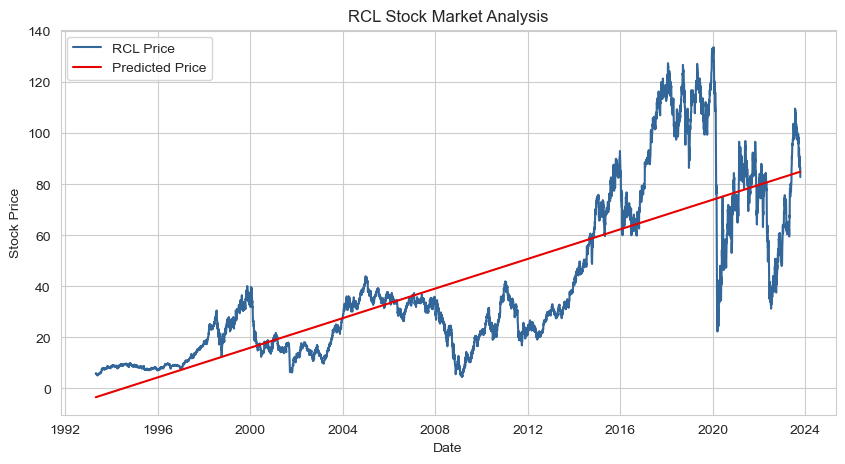

In [121]:
plot_stock_analysis('RCL', '#336699', 'up')

### RCL Monte Carlo Analysis

RCL expected stock price is: R136,78


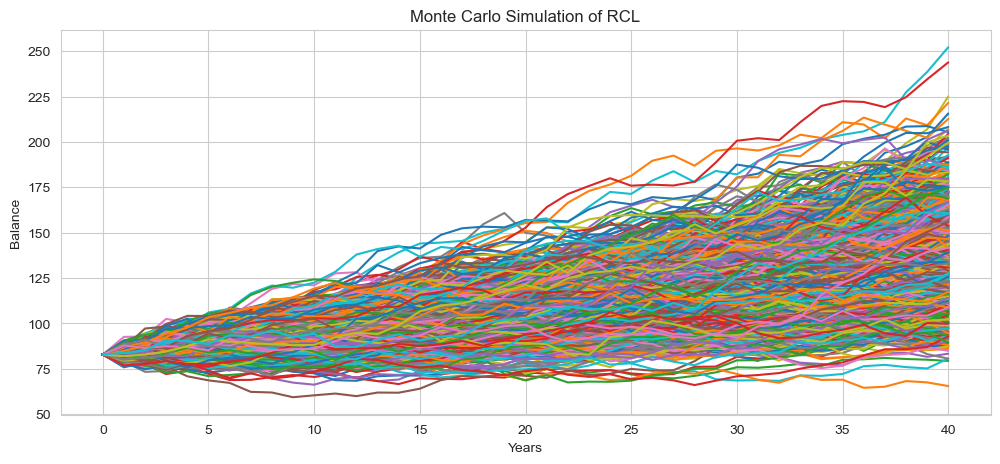

In [122]:
monte_carlo_simulation('RCL', 'en_ZA.UTF-8')

### RCL Monte Carlo Simulation Shape Distribution

RCL median stock price: R134,57
RCL stock price 90% confidence interval: (R98,37 : R183,21)


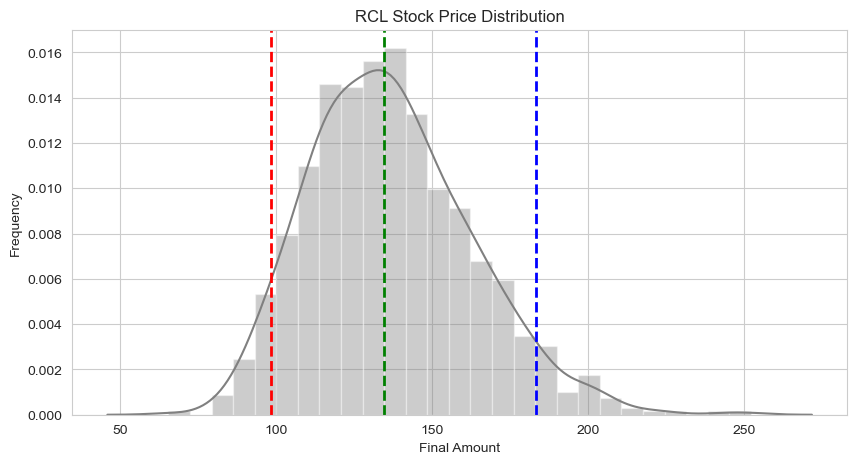

In [123]:
stock_price_distribution('RCL', 'en_ZA.UTF-8')

### Calculate RCL Return On Investment

In [124]:
# 1 ZAR = R1 ZAR  
calculate_return_on_investment('RCL', 1, 'en_ZA.UTF-8')

# Store stock value for comparism with other stocks 
RCL_FV_ZAR = FV_ZAR
RCL_capital_gain = capital_gain
RCL_capital_gain_percentage = capital_gain_percentage

Initial investment: R100 000,00
RCL Return on investment: R165 138,18
RCL Capital gain/loss: R65 138,18
RCL Capital gain/loss percentage: 65.14%


### Compare Satrix Top 40 Indexes

Absa Group Limited is the index with the largest return on investment: R195 354,53 and capital gain percentage of 95.35%


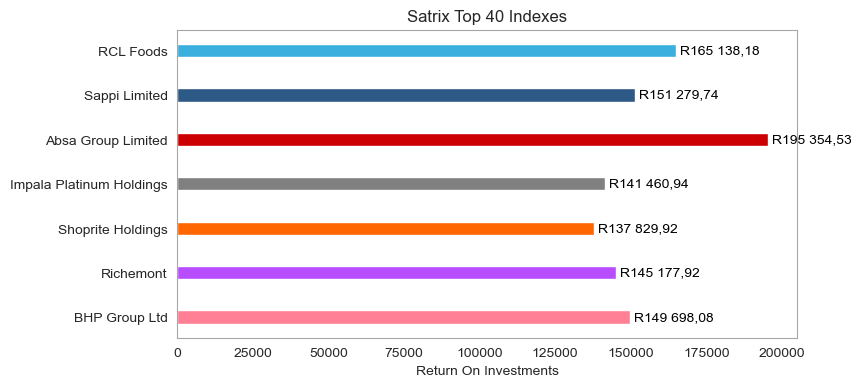

In [125]:
# Define financial market indexes
indexes = {
    'indexes': ['BHP Group Ltd', 'Richemont', 'Shoprite Holdings', 'Impala Platinum Holdings', 'Absa Group Limited', 'Sappi Limited', 'RCL Foods'],
    'prices': [BHP_FV_ZAR, CFR_FV_ZAR, SHP_FV_ZAR, IMP_FV_ZAR, ABG_FV_ZAR, SAP_FV_ZAR, RCL_FV_ZAR],
    'capital_gains': [BHP_capital_gain, CFR_capital_gain, SHP_capital_gain, IMP_capital_gain, ABG_capital_gain, SAP_capital_gain, RCL_capital_gain],
    'capital_gains_percentage': [BHP_capital_gain_percentage, CFR_capital_gain_percentage, SHP_capital_gain_percentage, IMP_capital_gain_percentage, ABG_capital_gain_percentage, SAP_capital_gain_percentage, RCL_capital_gain_percentage]
}

compare_stocks('Satrix Top 40', indexes, 'en_ZA.UTF-8')

# Store best stock for comparism with other stocks
satrix_largest_price_symbol = largest_price_symbol
satrix_largest_price_value = largest_price_value
satrix_largest_capital_gp = largest_capital_gp

## 4. Compare Best Performing Indexes From Different Asset Classes

ChainLink is the index with the largest return on investment: R2 002 233,77 and capital gain percentage of 1902.23%


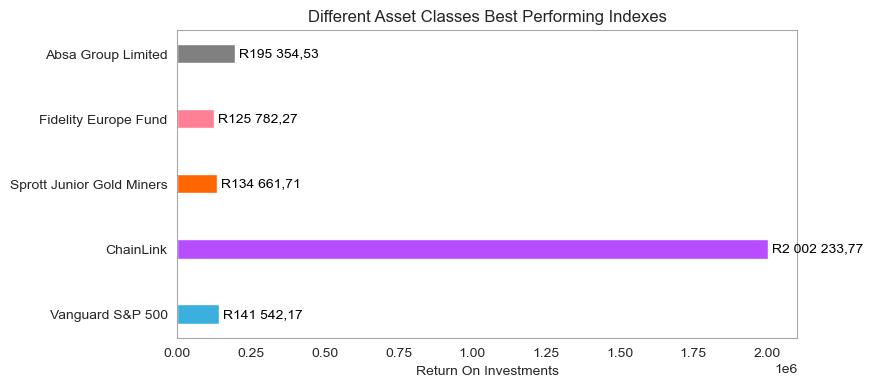

In [126]:
# Define financial market indexes

indexes = {
    'indexes': [vanguard_largest_price_symbol, crypto_largest_price_symbol, gold_largest_price_symbol, fidelity_largest_price_symbol, satrix_largest_price_symbol],
    'prices': [vanguard_largest_price_value, crypto_largest_price_value, gold_largest_price_value, fidelity_largest_price_value, satrix_largest_price_value],
    'capital_gains_percentage': [vanguard_largest_capital_gp, crypto_largest_capital_gp, gold_largest_capital_gp, fidelity_largest_capital_gp, satrix_largest_capital_gp]
}

compare_stocks('Different Asset Classes Best Performing', indexes, 'en_ZA.UTF-8')

## 5. Recommendations

This assignment analysed and compared indexes from different asset classes.
The analysis revealed that Absa Group Limited, ChainLink, Fidelity Europe Fund, Sprott Junior Gold Miners, and Vanguard S&P 500 were the top indexes with the highest return on investment from each asset class.<br>
Based on the  quantitative analysis we recommend that investors should invest in ChainLink from the Crypto asset class as it offers the highest return on investment compared to other top-performing indexes from other asset classes.
Since the ChainLink stock offers a return on investment of  R2 002 233,77 with a capital gain percentage of 1902.23% and a profit of R1 829 293,60. Futhermore, the stock market analysis also indicates a 20,02% increase in ChainLink stock from 8,40
to 168.19 dollars after 40 years, with a 90% confidence interval of 2,36 to 667,22 dollars.